# Antispoofing

In this homework, you will develop a countermeasure against deepfakes and then try to explain it using various XAI techniques.

More specifically, you will implement and train a Countermeasure (CM) system on the Logical Access partition of the [ASVSpoof 2019 Dataset](https://datashare.ed.ac.uk/handle/10283/3336) ([Kaggle Link](https://www.kaggle.com/datasets/awsaf49/asvpoof-2019-dataset)). You may find the [ASVspoof 2019 evaluation plan](https://www.asvspoof.org/asvspoof2019/asvspoof2019_evaluation_plan.pdf) useful.

For the CM, we choose [LightCNN (LCCN)](https://arxiv.org/abs/1511.02683) that once achieved the top place in the competition. We will follow the Speech Technology Center (STC) [paper](https://arxiv.org/abs/1904.05576).

**Hints**:

1. Use STFT (FFT in the paper) as front-end.

2. The dropout layer is put before the last batch norm.

## Dataset [0.5 pts]

We want to train a neural network to predict if the input audio is real or fake. To do so, we need a dataset first. In this homework, we will work with [ASVspoof19](https://arxiv.org/pdf/1911.01601.pdf).

Create a `Dataset` class that downloads the dataset, parses its metadata and, given index $i$, returns $i$-th object of the dataset. Do not forget to preprocess audio for LCNN (calculate stft, etc.).

In [ ]:
import os

if not os.path.exists('asvpoof-2019-dataset.zip'):
    print("Downloading and unzipping dataset...")
    !curl -L -C - -o asvpoof-2019-dataset.zip  https://www.kaggle.com/api/v1/datasets/download/awsaf49/asvpoof-2019-dataset
    !unzip -o -q ./asvpoof-2019-dataset.zip
else:
    print("Dataset already exists, skipping download and unzip.")

!ls asvpoof*

Dataset already exists, skipping download and unzip.
/bin/bash: /home/dukei/anaconda3/lib/libtinfo.so.6: no version information available (required by /bin/bash)
asvpoof-2019-dataset.zip


In [ ]:
import torch
from torch.utils.data import Dataset
import torchaudio
import torchaudio.transforms as T
import os

class ASVspoof19Dataset(Dataset):
    def __init__(self, root_dir, partition="LA", subset="train", sample_rate=16000,
                 # Новые параметры для STFT, соответствующие статье STC
                 stft_n_fft=1724, # Длина окна 1724
                 stft_hop_length=int(16000 * 0.0081), # Шаг 0.0081 с при 16 кГц -> 129 отсчетов
                 stft_window_fn=torch.blackman_window, # Функция окна Blackman
                 stft_max_frames=600, # Только первые 600 кадров
                 n_mels=80, # Количество полос мел-фильтров для мел-спектрограммы
                 return_waveform=False, return_mel=False, return_stft=True):
        """
        Инициализирует набор данных ASVspoof19.

        Аргументы:
            root_dir (str): Корневой каталог, куда извлечен набор данных ASVspoof 2019.
                            Этот каталог должен содержать папки 'LA' и 'ASVspoof2019_LA_train' и т.д.
            partition (str): Раздел данных для загрузки ('LA' или 'PA').
            subset (str): Подмножество данных для загрузки ('train', 'dev' или 'eval').
            sample_rate (int): Целевая частота дискретизации аудио.
            stft_n_fft (int): Размер FFT (длина окна) для STFT.
            stft_hop_length (int): Длина шага между окнами STFT.
            stft_window_fn (callable): Функция окна для STFT (например, torch.hann_window, torch.blackman_window).
            stft_max_frames (int): Максимальное количество кадров STFT для возврата.
            n_mels (int): Количество полос мел-фильтров для мел-спектрограммы.
            return_waveform (bool): Если True, возвращает необработанную форму волны.
            return_mel (bool): Если True, возвращает логарифмическую мел-спектрограмму.
            return_stft (bool): Если True, возвращает логарифмическую степенную спектрограмму (LCNN input).
        """
        self.root_dir = root_dir
        self.partition = partition.upper() # Приводим к верхнему регистру для единообразия
        self.subset = subset
        self.sample_rate = sample_rate
        self.stft_n_fft = stft_n_fft
        self.stft_hop_length = stft_hop_length
        self.stft_window_fn = stft_window_fn
        self.stft_max_frames = stft_max_frames
        self.n_mels = n_mels

        self.return_waveform = return_waveform
        self.return_mel = return_mel
        self.return_stft = return_stft

        subset_dir = os.path.join(self.root_dir, self.partition, self.partition)
        self.audio_dir = os.path.join(subset_dir, f"ASVspoof2019_{self.partition}_{self.subset}", "flac")

        # Определяем суффикс протокола в зависимости от подмножества
        protocol_suffix = 'trn' if self.subset == 'train' else 'trl'
        protocol_path = os.path.join(subset_dir, f"ASVspoof2019_{self.partition}_cm_protocols",
                                     f"ASVspoof2019.{self.partition}.cm.{self.subset}.{protocol_suffix}.txt")

        self.data = []
        with open(protocol_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                # Пример формата строки протокола: LA_0079 LA_T_1000000 bonafide - -
                # Или: LA_0079 LA_T_1000000 spoof A01 -
                filename = parts[1] # например, LA_T_1000000
                label = 0 if parts[4] == 'bonafide' else 1 # 0 для подлинных, 1 для поддельных
                self.data.append((filename, label))

        # Определяем преобразование Спектрограммы для вывода степенной спектрограммы (квадрат магнитуды)
        # Теперь используем параметры из статьи STC для STFT
        if self.return_stft:
            self.spectrogram_transform = T.Spectrogram(
                n_fft=self.stft_n_fft,
                hop_length=self.stft_hop_length,
                window_fn=self.stft_window_fn, # Добавлено окно Blackman
                power=2, # возвращает квадрат магнитуды (степенная спектрограмма)
                return_complex=False # обеспечивает действительный вывод
            )

        if self.return_mel:
            # Мел-спектрограмма также будет использовать те же параметры STFT для согласованности
            self.mel_spectrogram_transform = T.MelSpectrogram(
                sample_rate=self.sample_rate,
                n_fft=self.stft_n_fft,
                hop_length=self.stft_hop_length,
                n_mels=self.n_mels,
                power=2 # Соответствует степенной спектрограмме
            )

        # Инициализируем ресемплер, будет обновлен в __getitem__ при необходимости
        self.resampler = T.Resample(orig_freq=self.sample_rate, new_freq=self.sample_rate)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        filename, label = self.data[idx]
        audio_path = os.path.join(self.audio_dir, f"{filename}.flac")

        # Загружаем аудиофайл
        waveform, sr = torchaudio.load(audio_path)

        # Передискретизируем, если частота дискретизации отличается (ASVspoof обычно 16 кГц)
        if sr != self.sample_rate:
            if self.resampler.orig_freq != sr:
                self.resampler = T.Resample(orig_freq=sr, new_freq=self.sample_rate)
            waveform = self.resampler(waveform)

        # Если стерео, преобразуем в моно, взяв первый канал
        if waveform.shape[0] > 1:
            waveform = waveform[0].unsqueeze(0) # Сохраняем размерность канала для преобразования (1, num_samples)

        result = {'label': torch.tensor(label, dtype=torch.long)}

        if self.return_waveform:
            result['waveform'] = waveform.squeeze(0) # Удаляем размерность канала, если она равна 1

        if self.return_stft:
            # Вычисляем степенную спектрограмму
            power_spectrogram = self.spectrogram_transform(waveform)
            # Преобразуем в логарифмическую степенную спектрограмму, добавляем небольшой эпсилон для численной стабильности
            log_power_spectrogram = torch.log10(power_spectrogram + 1e-6)

            # Обрезаем до stft_max_frames, если указано
            if self.stft_max_frames and log_power_spectrogram.shape[1] > self.stft_max_frames:
                log_power_spectrogram = log_power_spectrogram[:, :self.stft_max_frames]

            result['stft'] = log_power_spectrogram.squeeze(0) # Удаляем размерность канала, если она равна 1

        if self.return_mel:
            # Вычисляем мел-спектрограмму
            mel_spectrogram = self.mel_spectrogram_transform(waveform)
            # Преобразуем в логарифмическую мел-спектрограмму, добавляем небольшой эпсилон для численной стабильности
            log_mel_spectrogram = torch.log10(mel_spectrogram + 1e-6)
            result['mel'] = log_mel_spectrogram.squeeze(0) # Удаляем размерность канала, если она равна 1

        return result

**Hint**: when working in Kaggle, it is easier and faster to use dataset as kaggle input. We can use it directly or add a symlink to a local dir using `ln -s`.
**Hint**: it might be easier to do this homework in Kaggle, since model training may take some time

Create train/eval dataset and dataloaders:

In [ ]:
from torch.utils.data import DataLoader

# Определяем корневой каталог, где расположен набор данных ASVspoof19
root_dir = ""

# Параметры DataLoader
batch_size = 16
num_workers = 0

# Создаем экземпляры набора данных
train_dataset = ASVspoof19Dataset(root_dir=root_dir, subset="train", return_stft=True, return_mel=False, return_waveform=True)
dev_dataset = ASVspoof19Dataset(root_dir=root_dir, subset="dev", return_stft=True, return_mel=False, return_waveform=False)
eval_dataset = ASVspoof19Dataset(root_dir=root_dir, subset="eval", return_stft=True, return_mel=False, return_waveform=True)

# Создаем загрузчики данных
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
dev_dataloader = DataLoader(dev_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
eval_dataloader = DataLoader(eval_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

print(f"Размер обучающего набора данных: {len(train_dataset)}")
print(f"Размер валидационного набора данных: {len(dev_dataset)}")
print(f"Размер тестового набора данных: {len(eval_dataset)}")

print(f"Количество батчей в обучающем загрузчике: {len(train_dataloader)}")
print(f"Количество батчей в валидационном загрузчике: {len(dev_dataloader)}")
print(f"Количество батчей в тестовом загрузчике: {len(eval_dataloader)}")

Размер обучающего набора данных: 25380
Размер валидационного набора данных: 24844
Размер тестового набора данных: 71237
Количество батчей в обучающем загрузчике: 1587
Количество батчей в валидационном загрузчике: 1553
Количество батчей в тестовом загрузчике: 4453


Visualize one object, just to check that all is fine:

Визуализация 3 случайных элементов из обучающего набора данных:


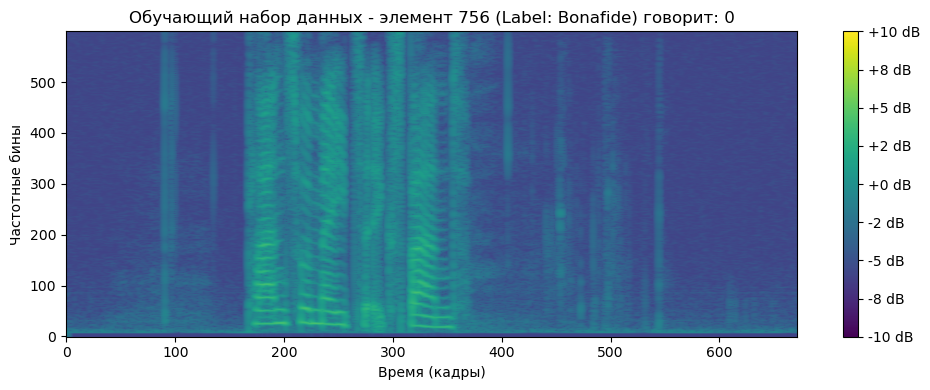

Аудио:


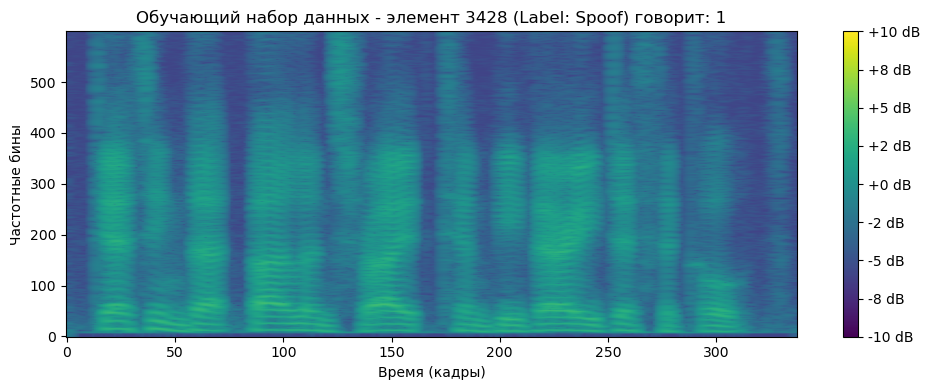

Аудио:


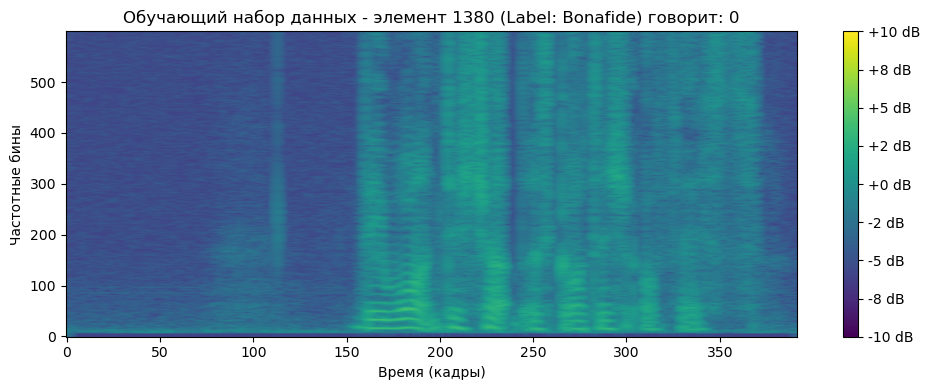

Аудио:



Визуализация 3 случайных элементов из тестового набора данных:


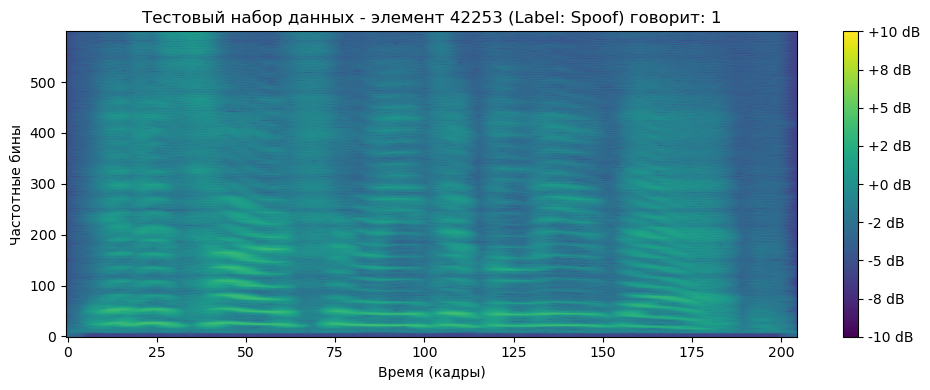

Аудио:


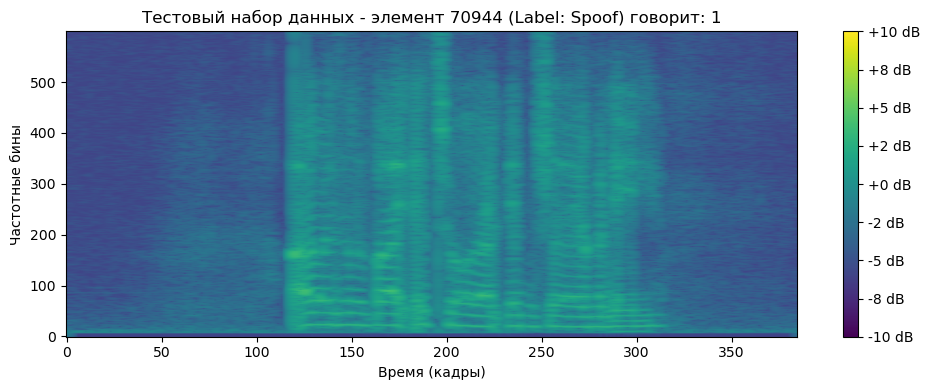

Аудио:


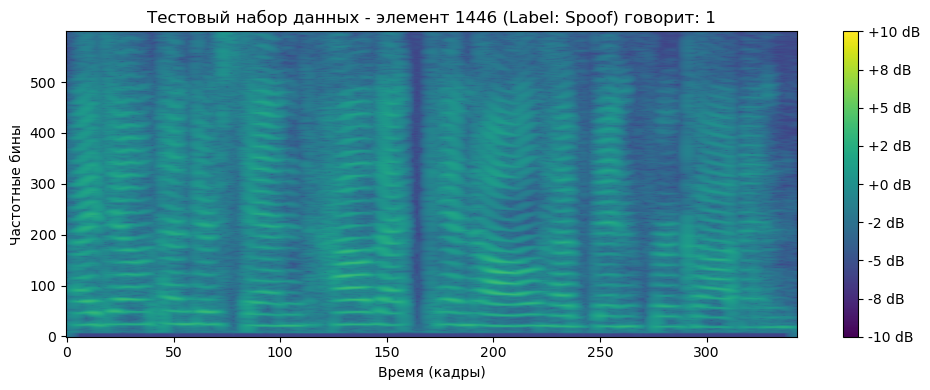

Аудио:


In [ ]:

import matplotlib.pyplot as plt
import random
import numpy as np
import IPython.display as ipd
import warnings

# Подавляем предупреждения torchaudio, которые могут возникать после обновления
warnings.filterwarnings('ignore', category=UserWarning, module='torchaudio')

def plot_spectrogram_and_audio(spectrogram, waveform, sample_rate, label, title):
    plt.figure(figsize=(10, 4))
    plt.imshow(spectrogram.squeeze(0).numpy(), aspect='auto', origin='lower',
               cmap='viridis', vmin=-10, vmax=10) # Adjust vmin/vmax for better visualization
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"{title} (Label: {'Spoof' if label == 1 else 'Bonafide'}) говорит: {label}")
    plt.xlabel("Время (кадры)")
    plt.ylabel("Частотные бины")
    plt.tight_layout()
    plt.show()
    print("Аудио:")
    display(ipd.Audio(waveform.numpy(), rate=sample_rate))

print("Визуализация 3 случайных элементов из обучающего набора данных:")
for i in range(3):
    idx = random.randint(0, len(train_dataset) - 1)
    sample = train_dataset[idx]
    spectrogram = sample['stft']
    waveform = sample['waveform']
    label = sample['label'].item()
    plot_spectrogram_and_audio(spectrogram, waveform, train_dataset.sample_rate, label, f"Обучающий набор данных - элемент {idx}")

print("\nВизуализация 3 случайных элементов из тестового набора данных:")
for i in range(3):
    idx = random.randint(0, len(eval_dataset) - 1)
    sample = eval_dataset[idx]
    spectrogram = sample['stft']
    waveform = sample['waveform']
    label = sample['label'].item()
    plot_spectrogram_and_audio(spectrogram, waveform, eval_dataset.sample_rate, label, f"Тестовый набор данных - элемент {idx}")

## Loss function [0.5 pts]

In the lecture, we saw different softmax losses and the motivation behind them for the ASV task. However, they can also be used for any classification task, such as synthesized speech detection. The papers suggest to use A(M)-Softmax or Cross-Entropy. The STC paper argues that A-Softmax is better.

(a) Explain what are the benefits of A-softmax over cross-entropy according to the STC paper?

(b) Analyse the [NII paper](https://arxiv.org/pdf/2103.11326) and explain if complicated Softmax is actually needed to achieve good EER or we can go with Cross Entropy.

**Ответ**:

**(a) В чем заключаются преимущества A-Softmax перед кросс-энтропией согласно статье STC?**

Согласно статье Speech Technology Center (STC) "Light Convolutional Neural Network for Preventing Spoofing Attacks on Speaker Recognition Systems" (ссылка: https://arxiv.org/abs/1904.05576):

*   **A-Softmax (Additive Angular Margin Softmax)** предназначен для повышения дискриминационной способности признаков за счет максимизации углового расстояния между классами. В контексте задачи анти-спуфинга, это означает более четкое разделение между подлинными (bona fide) и поддельными (spoof) образцами.
*   **Кросс-энтропия (Cross-Entropy)** фокусируется на том, чтобы увеличить вероятность правильного класса, но не обязательно гарантирует большое расстояние между эмбеддингами разных классов. Это может привести к тому, что границы решений будут менее четкими, и модель будет менее робастной к вариациям в данных.
*   STC утверждает, что A-Softmax, изменяя функцию потерь так, чтобы увеличить межклассовую дисперсию и уменьшить внутриклассовую дисперсию в пространстве признаков, позволяет модели лучше различать тонкие различия между подлинными и спуф-аудио, что критически важно для обнаружения атак. Это приводит к улучшению производительности в метриках, таких как EER (Equal Error Rate), которые чувствительны к разделимости классов.

**(b) Анализ статьи NII: Действительно ли нужна сложная Softmax-функция для достижения хорошего EER, или можно обойтись кросс-энтропией?**

Статья "An Empirical Study of Loss Functions for Anti-Spoofing and Automatic Speaker Verification" от NII (ссылка: https://arxiv.org/pdf/2103.11326) представляет всесторонний анализ различных функций потерь для задач анти-спуфинга и верификации диктора. Основные выводы статьи NII, касающиеся необходимости сложных Softmax-функций, заключаются в следующем:

*   **Сравнение с кросс-энтропией**: Статья NII показывает, что, хотя различные варианты ArcFace, CosFace и других сложных Softmax-функций (которые включают угловые или аддитивные отступы) часто превосходят стандартную кросс-энтропию при определенных условиях, этот выигрыш не всегда является абсолютным или существенным. Авторы обнаружили, что для некоторых конфигураций и моделей, хорошо настроенная кросс-энтропия может достигать сравнимой или даже лучшей производительности, особенно когда архитектура модели уже обладает достаточной выразительной мощностью.
*   **Факторы влияния**: NII подчеркивает, что на конечную производительность сильно влияют не только функция потерь, но и архитектура модели, размер и качество данных, а также стратегия обучения (например, расписание изменения скорости обучения, аугментация данных). В некоторых случаях, даже если теоретически сложная Softmax-функция должна быть лучше, на практике ее преимущества могут быть нивелированы или не реализованы из-за других факторов.
*   **Вывод NII**: Статья NII склоняется к тому, что хотя сложные Softmax-функции могут предложить теоретические преимущества в улучшении разделимости классов, они не всегда являются абсолютно необходимыми для достижения хорошего EER. При тщательной оптимизации других аспектов системы (архитектура, данные, обучение) простая кросс-энтропия может быть вполне достаточной и даже предпочтительной из-за своей простоты и вычислительной эффективности. Таким образом, **не всегда нужна сложная Softmax-функция**; кросс-энтропия может быть адекватной, особенно если модель и данные хорошо подобраны.

Кстати, всё вышесказанное я наблюдал при выполнении проекта по распознаванию лиц. И полностью согласен с выводами статей - несмотря на то, что на тренировочной выборке дополнительная стимуляция разделения эмбеддингов в лосс функции помогает их разделить, это не гарантирует, что модель будет лучше работать на ранее не виденных примерах. Часто бывает, что обычная кросс-энтропия показывает в этих случаях лучшие результаты.

Following tha NII paper, we will continue with Cross Entropy

In [ ]:
from torch import nn

criterion = nn.CrossEntropyLoss()

## Evaluation metric [0.5 pts]

We will use equal error rate as the primary evaluation metric. The code for calculating metrics is provided by the ASVspoof itself. We just need to write a wrapper. Given model logits and labels, calculate EER using the ASVspoof functions.

Your model returns two probas: [spoof_proba, bona_proba]. Be careful with the EER metric and recal how ROC curve is computed to ensure that you do not make a mistake.

In [ ]:
# download asvspoof metric calculation functions
!wget https://raw.githubusercontent.com/markovka17/dla/refs/heads/2023/hw5_as/calculate_eer.py

/bin/bash: /home/dukei/anaconda3/lib/libtinfo.so.6: no version information available (required by /bin/bash)
--2026-05-10 21:46:17--  https://raw.githubusercontent.com/markovka17/dla/refs/heads/2023/hw5_as/calculate_eer.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14555 (14K) [text/plain]
Saving to: ‘calculate_eer.py.6’

calculate_eer.py.6  100%[===================>]  14.21K  --.-KB/s    in 0.007s  

2026-05-10 21:46:17 (1.97 MB/s) - ‘calculate_eer.py.6’ saved [14555/14555]



In [ ]:
# @title
# %load calculate_eer.py
import sys
import os

import numpy as np


def calculate_tDCF_EER(cm_scores_file,
                       asv_score_file,
                       output_file,
                       printout=True):
    # Replace CM scores with your own scores or provide score file as the
    # first argument.
    # cm_scores_file =  'score_cm.txt'
    # Replace ASV scores with organizers' scores or provide score file as
    # the second argument.
    # asv_score_file = 'ASVspoof2019.LA.asv.eval.gi.trl.scores.txt'

    # Fix tandem detection cost function (t-DCF) parameters
    Pspoof = 0.05
    cost_model = {
        'Pspoof': Pspoof,  # Prior probability of a spoofing attack
        'Ptar': (1 - Pspoof) * 0.99,  # Prior probability of target speaker
        'Pnon': (1 - Pspoof) * 0.01,  # Prior probability of nontarget speaker
        'Cmiss': 1,  # Cost of ASV system falsely rejecting target speaker
        'Cfa': 10,  # Cost of ASV system falsely accepting nontarget speaker
        'Cmiss_asv': 1,  # Cost of ASV system falsely rejecting target speaker
        'Cfa_asv':
        10,  # Cost of ASV system falsely accepting nontarget speaker
        'Cmiss_cm': 1,  # Cost of CM system falsely rejecting target speaker
        'Cfa_cm': 10,  # Cost of CM system falsely accepting spoof
    }

    # Load organizers' ASV scores
    asv_data = np.genfromtxt(asv_score_file, dtype=str)
    # asv_sources = asv_data[:, 0]
    asv_keys = asv_data[:, 1]
    asv_scores = asv_data[:, 2].astype(np.float)

    # Load CM scores
    cm_data = np.genfromtxt(cm_scores_file, dtype=str)
    # cm_utt_id = cm_data[:, 0]
    cm_sources = cm_data[:, 1]
    cm_keys = cm_data[:, 2]
    cm_scores = cm_data[:, 3].astype(np.float)

    # Extract target, nontarget, and spoof scores from the ASV scores
    tar_asv = asv_scores[asv_keys == 'target']
    non_asv = asv_scores[asv_keys == 'nontarget']
    spoof_asv = asv_scores[asv_keys == 'spoof']

    # Extract bona fide (real human) and spoof scores from the CM scores
    bona_cm = cm_scores[cm_keys == 'bonafide']
    spoof_cm = cm_scores[cm_keys == 'spoof']

    # EERs of the standalone systems and fix ASV operating point to
    # EER threshold
    eer_asv, asv_threshold = compute_eer(tar_asv, non_asv)
    eer_cm = compute_eer(bona_cm, spoof_cm)[0]

    attack_types = [f'A{_id:02d}' for _id in range(7, 20)]
    if printout:
        spoof_cm_breakdown = {
            attack_type: cm_scores[cm_sources == attack_type]
            for attack_type in attack_types
        }

        eer_cm_breakdown = {
            attack_type: compute_eer(bona_cm,
                                     spoof_cm_breakdown[attack_type])[0]
            for attack_type in attack_types
        }

    [Pfa_asv, Pmiss_asv,
     Pmiss_spoof_asv] = obtain_asv_error_rates(tar_asv, non_asv, spoof_asv,
                                               asv_threshold)

    # Compute t-DCF
    tDCF_curve, CM_thresholds = compute_tDCF(bona_cm,
                                             spoof_cm,
                                             Pfa_asv,
                                             Pmiss_asv,
                                             Pmiss_spoof_asv,
                                             cost_model,
                                             print_cost=False)

    # Minimum t-DCF
    min_tDCF_index = np.argmin(tDCF_curve)
    min_tDCF = tDCF_curve[min_tDCF_index]

    if printout:
        with open(output_file, "w") as f_res:
            f_res.write('\nCM SYSTEM\n')
            f_res.write('\tEER\t\t= {:8.9f} % '
                        '(Equal error rate for countermeasure)\n'.format(
                            eer_cm * 100))

            f_res.write('\nTANDEM\n')
            f_res.write('\tmin-tDCF\t\t= {:8.9f}\n'.format(min_tDCF))

            f_res.write('\nBREAKDOWN CM SYSTEM\n')
            for attack_type in attack_types:
                _eer = eer_cm_breakdown[attack_type] * 100
                f_res.write(
                    f'\tEER {attack_type}\t\t= {_eer:8.9f} % (Equal error rate for {attack_type}\n'
                )
        os.system(f"cat {output_file}")

    return eer_cm * 100, min_tDCF


def obtain_asv_error_rates(tar_asv, non_asv, spoof_asv, asv_threshold):

    # False alarm and miss rates for ASV
    Pfa_asv = sum(non_asv >= asv_threshold) / non_asv.size
    Pmiss_asv = sum(tar_asv < asv_threshold) / tar_asv.size

    # Rate of rejecting spoofs in ASV
    if spoof_asv.size == 0:
        Pmiss_spoof_asv = None
    else:
        Pmiss_spoof_asv = np.sum(spoof_asv < asv_threshold) / spoof_asv.size

    return Pfa_asv, Pmiss_asv, Pmiss_spoof_asv


def compute_det_curve(target_scores, nontarget_scores):

    n_scores = target_scores.size + nontarget_scores.size
    all_scores = np.concatenate((target_scores, nontarget_scores))
    labels = np.concatenate(
        (np.ones(target_scores.size), np.zeros(nontarget_scores.size)))

    # Sort labels based on scores
    indices = np.argsort(all_scores, kind='mergesort')
    labels = labels[indices]

    # Compute false rejection and false acceptance rates
    tar_trial_sums = np.cumsum(labels)
    nontarget_trial_sums = nontarget_scores.size - \
        (np.arange(1, n_scores + 1) - tar_trial_sums)

    # false rejection rates
    frr = np.concatenate(
        (np.atleast_1d(0), tar_trial_sums / target_scores.size))
    far = np.concatenate((np.atleast_1d(1), nontarget_trial_sums /
                          nontarget_scores.size))  # false acceptance rates
    # Thresholds are the sorted scores
    thresholds = np.concatenate(
        (np.atleast_1d(all_scores[indices[0]] - 0.001), all_scores[indices]))

    return frr, far, thresholds


def compute_eer(bonafide_scores, other_scores):
    """
    Returns equal error rate (EER) and the corresponding threshold.
    """
    frr, far, thresholds = compute_det_curve(bonafide_scores, other_scores)
    abs_diffs = np.abs(frr - far)
    min_index = np.argmin(abs_diffs)
    eer = np.mean((frr[min_index], far[min_index]))
    return eer, thresholds[min_index]


def compute_tDCF(bonafide_score_cm, spoof_score_cm, Pfa_asv, Pmiss_asv,
                 Pmiss_spoof_asv, cost_model, print_cost):
    """
    Compute Tandem Detection Cost Function (t-DCF) [1] for a fixed ASV system.
    In brief, t-DCF returns a detection cost of a cascaded system of this form,

      Speech waveform -> [CM] -> [ASV] -> decision

    where CM stands for countermeasure and ASV for automatic speaker
    verification. The CM is therefore used as a 'gate' to decided whether or
    not the input speech sample should be passed onwards to the ASV system.
    Generally, both CM and ASV can do detection errors. Not all those errors
    are necessarily equally cost, and not all types of users are necessarily
    equally likely. The tandem t-DCF gives a principled with to compare
    different spoofing countermeasures under a detection cost function
    framework that takes that information into account.

    INPUTS:

      bonafide_score_cm   A vector of POSITIVE CLASS (bona fide or human)
                          detection scores obtained by executing a spoofing
                          countermeasure (CM) on some positive evaluation trials.
                          trial represents a bona fide case.
      spoof_score_cm      A vector of NEGATIVE CLASS (spoofing attack)
                          detection scores obtained by executing a spoofing
                          CM on some negative evaluation trials.
      Pfa_asv             False alarm (false acceptance) rate of the ASV
                          system that is evaluated in tandem with the CM.
                          Assumed to be in fractions, not percentages.
      Pmiss_asv           Miss (false rejection) rate of the ASV system that
                          is evaluated in tandem with the spoofing CM.
                          Assumed to be in fractions, not percentages.
      Pmiss_spoof_asv     Miss rate of spoof samples of the ASV system that
                          is evaluated in tandem with the spoofing CM. That
                          is, the fraction of spoof samples that were
                          rejected by the ASV system.
      cost_model          A struct that contains the parameters of t-DCF,
                          with the following fields.

                          Ptar        Prior probability of target speaker.
                          Pnon        Prior probability of nontarget speaker (zero-effort impostor)
                          Psoof       Prior probability of spoofing attack.
                          Cmiss_asv   Cost of ASV falsely rejecting target.
                          Cfa_asv     Cost of ASV falsely accepting nontarget.
                          Cmiss_cm    Cost of CM falsely rejecting target.
                          Cfa_cm      Cost of CM falsely accepting spoof.

      print_cost          Print a summary of the cost parameters and the
                          implied t-DCF cost function?

    OUTPUTS:

      tDCF_norm           Normalized t-DCF curve across the different CM
                          system operating points; see [2] for more details.
                          Normalized t-DCF > 1 indicates a useless
                          countermeasure (as the tandem system would do
                          better without it). min(tDCF_norm) will be the
                          minimum t-DCF used in ASVspoof 2019 [2].
      CM_thresholds       Vector of same size as tDCF_norm corresponding to
                          the CM threshold (operating point).

    NOTE:
    o     In relative terms, higher detection scores values are assumed to
          indicate stronger support for the bona fide hypothesis.
    o     You should provide real-valued soft scores, NOT hard decisions. The
          recommendation is that the scores are log-likelihood ratios (LLRs)
          from a bonafide-vs-spoof hypothesis based on some statistical model.
          This, however, is NOT required. The scores can have arbitrary range
          and scaling.
    o     Pfa_asv, Pmiss_asv, Pmiss_spoof_asv are in fractions, not percentages.

    References:

      [1] T. Kinnunen, K.-A. Lee, H. Delgado, N. Evans, M. Todisco,
          M. Sahidullah, J. Yamagishi, D.A. Reynolds: "t-DCF: a Detection
          Cost Function for the Tandem Assessment of Spoofing Countermeasures
          and Automatic Speaker Verification", Proc. Odyssey 2018: the
          Speaker and Language Recognition Workshop, pp. 312--319, Les Sables d'Olonne,
          France, June 2018 (https://www.isca-speech.org/archive/Odyssey_2018/pdfs/68.pdf)

      [2] ASVspoof 2019 challenge evaluation plan
          TODO: <add link>
    """

    # Sanity check of cost parameters
    if cost_model['Cfa_asv'] < 0 or cost_model['Cmiss_asv'] < 0 or \
            cost_model['Cfa_cm'] < 0 or cost_model['Cmiss_cm'] < 0:
        print('WARNING: Usually the cost values should be positive!')

    if cost_model['Ptar'] < 0 or cost_model['Pnon'] < 0 or cost_model['Pspoof'] < 0 or \
            np.abs(cost_model['Ptar'] + cost_model['Pnon'] + cost_model['Pspoof'] - 1) > 1e-10:
        sys.exit(
            'ERROR: Your prior probabilities should be positive and sum up to one.'
        )

    # Unless we evaluate worst-case model, we need to have some spoof tests against asv
    if Pmiss_spoof_asv is None:
        sys.exit(
            'ERROR: you should provide miss rate of spoof tests against your ASV system.'
        )

    # Sanity check of scores
    combined_scores = np.concatenate((bonafide_score_cm, spoof_score_cm))
    if np.isnan(combined_scores).any() or np.isinf(combined_scores).any():
        sys.exit('ERROR: Your scores contain nan or inf.')

    # Sanity check that inputs are scores and not decisions
    n_uniq = np.unique(combined_scores).size
    if n_uniq < 3:
        sys.exit(
            'ERROR: You should provide soft CM scores - not binary decisions')

    # Obtain miss and false alarm rates of CM
    Pmiss_cm, Pfa_cm, CM_thresholds = compute_det_curve(
        bonafide_score_cm, spoof_score_cm)

    # Constants - see ASVspoof 2019 evaluation plan
    C1 = cost_model['Ptar'] * (cost_model['Cmiss_cm'] - cost_model['Cmiss_asv'] * Pmiss_asv) - \
        cost_model['Pnon'] * cost_model['Cfa_asv'] * Pfa_asv
    C2 = cost_model['Cfa_cm'] * cost_model['Pspoof'] * (1 - Pmiss_spoof_asv)

    # Sanity check of the weights
    if C1 < 0 or C2 < 0:
        sys.exit(
            'You should never see this error but I cannot evalute tDCF with negative weights - please check whether your ASV error rates are correctly computed?'
        )

    # Obtain t-DCF curve for all thresholds
    tDCF = C1 * Pmiss_cm + C2 * Pfa_cm

    # Normalized t-DCF
    tDCF_norm = tDCF / np.minimum(C1, C2)

    # Everything should be fine if reaching here.
    if print_cost:

        print('t-DCF evaluation from [Nbona={}, Nspoof={}] trials\n'.format(
            bonafide_score_cm.size, spoof_score_cm.size))
        print('t-DCF MODEL')
        print('   Ptar         = {:8.5f} (Prior probability of target user)'.
              format(cost_model['Ptar']))
        print(
            '   Pnon         = {:8.5f} (Prior probability of nontarget user)'.
            format(cost_model['Pnon']))
        print(
            '   Pspoof       = {:8.5f} (Prior probability of spoofing attack)'.
            format(cost_model['Pspoof']))
        print(
            '   Cfa_asv      = {:8.5f} (Cost of ASV falsely accepting a nontarget)'
            .format(cost_model['Cfa_asv']))
        print(
            '   Cmiss_asv    = {:8.5f} (Cost of ASV falsely rejecting target speaker)'
            .format(cost_model['Cmiss_asv']))
        print(
            '   Cfa_cm       = {:8.5f} (Cost of CM falsely passing a spoof to ASV system)'
            .format(cost_model['Cfa_cm']))
        print(
            '   Cmiss_cm     = {:8.5f} (Cost of CM falsely blocking target utterance which never reaches ASV)'
            .format(cost_model['Cmiss_cm']))
        print(
            '\n   Implied normalized t-DCF function (depends on t-DCF parameters and ASV errors), s=CM threshold)'
        )

        if C2 == np.minimum(C1, C2):
            print(
                '   tDCF_norm(s) = {:8.5f} x Pmiss_cm(s) + Pfa_cm(s)\n'.format(
                    C1 / C2))
        else:
            print(
                '   tDCF_norm(s) = Pmiss_cm(s) + {:8.5f} x Pfa_cm(s)\n'.format(
                    C2 / C1))

    return tDCF_norm, CM_thresholds

In [ ]:
#from calculate_eer import compute_eer
import numpy as np
import torch

def get_eer(logits, labels):
    # Преобразуем логиты и метки в массивы numpy, если они являются тензорами PyTorch
    if isinstance(logits, torch.Tensor):
        logits = logits.detach().cpu().numpy()
    if isinstance(labels, torch.Tensor):
        labels = labels.detach().cpu().numpy()

    # Согласно определению датасета ASVspoof19Dataset:
    # label = 0 означает 'bonafide'
    # label = 1 означает 'spoof'
    # Модель LCNN выводит логиты в порядке [logit_для_класса_0, logit_для_класса_1].
    # Соответственно, logit_для_класса_0 соответствует 'bonafide', а logit_для_класса_1 - 'spoof'.
    # Для EER нам нужна оценка, где более высокое значение указывает на 'bonafide'.
    # Поэтому мы берем логиты для класса 'bonafide' (индекс 0).
    bona_scores = logits[:, 0] # Использование логитов для класса 0 (bonafide) как "bona fide" оценок

    # Разделяем оценки для образцов bona fide и spoof на основе истинных меток
    bonafide_true_scores = bona_scores[labels == 0] # Метки 0 - это bona fide
    spoof_true_scores = bona_scores[labels == 1]    # Метки 1 - это spoof

    # Вычисляем EER, используя предоставленную функцию
    eer, _ = compute_eer(bonafide_true_scores, spoof_true_scores)

    return eer


## LCNN Implementation [6.0 pts]

Create a `LCNN` class for the model architecture. Будем основываться на статье https://arxiv.org/pdf/1904.05576 "STC Antispoofing Systems for the ASVspoof2019 Challenge". Архитектура взята оттуда, за исключением расположения дропаута. В нашей версии результаты внезапно окажутся даже лучше.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MaxFeatureMap2D(nn.Module):
    def __init__(self):
        super(MaxFeatureMap2D, self).__init__()

    def forward(self, input):
        # Разделяем входной тензор на две равные части по каналам (измерение 1)
        # и возвращаем поэлементный максимум
        # Это работает как для (batch, C, H, W), так и для (batch, C), где C - размерность признаков
        return torch.max(input[:, :input.size(1)//2], input[:, input.size(1)//2:])

class LCNN(nn.Module):
    def __init__(self, input_dim=1):
        super(LCNN, self).__init__()

        self.conv_layers = nn.Sequential(
            # Блок 1: Conv2d -> MFM -> MaxPool
            nn.Conv2d(input_dim, 64, kernel_size=(5, 5), stride=1, padding=(2, 2)),
            MaxFeatureMap2D(),
            nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),

            # Блок 2: Conv2d -> MFM -> BatchNorm -> Conv2d -> MFM -> MaxPool
            nn.Conv2d(32, 64, kernel_size=(1, 1), stride=1, padding=(0, 0)),
            MaxFeatureMap2D(),
            nn.BatchNorm2d(32, affine=False),
            nn.Conv2d(32, 96, kernel_size=(3, 3), stride=1, padding=(1, 1)),
            MaxFeatureMap2D(),
            nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),

            # Блок 3: BatchNorm -> Conv2d -> MFM -> BatchNorm -> Conv2d -> MFM -> MaxPool
            nn.BatchNorm2d(48, affine=False),
            nn.Conv2d(48, 96, kernel_size=(1, 1), stride=1, padding=(0, 0)),
            MaxFeatureMap2D(),
            nn.BatchNorm2d(48, affine=False),
            nn.Conv2d(48, 128, kernel_size=(3, 3), stride=1, padding=(1, 1)),
            MaxFeatureMap2D(),
            nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),

            # Блок 4: Conv2d -> MFM -> BatchNorm -> Conv2d -> MFM -> BatchNorm -> Conv2d -> MFM -> MaxPool
            nn.Conv2d(64, 128, kernel_size=(1, 1), stride=1, padding=(0, 0)),
            MaxFeatureMap2D(),
            nn.BatchNorm2d(64, affine=False),
            nn.Conv2d(64, 64, kernel_size=(3, 3), stride=1, padding=(1, 1)),
            MaxFeatureMap2D(),
            nn.BatchNorm2d(32, affine=False),
            nn.Conv2d(32, 64, kernel_size=(1, 1), stride=1, padding=(0, 0)),
            MaxFeatureMap2D(),
            nn.BatchNorm2d(32, affine=False),
            nn.Conv2d(32, 64, kernel_size=(3, 3), stride=1, padding=(1, 1)),
            MaxFeatureMap2D(),
            nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),

            nn.Dropout(0.75) # Dropout после последнего сверточного блока
        )

        # После conv_layers, выход (batch, 32, H, W)
        # AdaptiveAvgPool2d(..., (1, 5)) преобразует в (batch, 32, 1, 5)
        # Затем flattening: 32 * 1 * 5 = 160 фич
        self.fc_block = nn.Sequential(
            nn.Linear(32 * 1 * 5, 160), # FC29: Вход 160, выход 160
            MaxFeatureMap2D(),          # MFM30: Уменьшает 160 до 80
            nn.BatchNorm1d(80),         # BatchNorm31: для 80 фич
            nn.Linear(80, 2)            # FC32: Вход 80, выход 2 (для бинарной классификации)
        )

    def forward(self, x):
        # x имеет форму: (batch, channel, height, width)
        conv_out = self.conv_layers(x)

        # Применяем адаптивное усредняющее пулинг для фиксации пространственных размеров
        # в (1, 5). Это делает выход фиксированного размера для FC слоев.
        # Выход: (batch, channels, 1, 5)
        pooled_features = F.adaptive_avg_pool2d(conv_out, (1, 5))

        # Изменяем форму для подачи в полносвязные слои: (batch, C*H*W)
        batch_size = pooled_features.size(0)
        flattened_features = pooled_features.view(batch_size, -1) # Выход (batch, 160)

        # Пропускаем через полносвязный блок
        out = self.fc_block(flattened_features)
        return out

In [ ]:
model = LCNN()

In [ ]:
# Определяем устройство (GPU, если доступно, иначе CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
import torch
import torch.nn.functional as F # Import F for softmax
import torch.nn as nn # Import nn for class definitions

print(f"Используемое устройство: {device}")

# Инициализируем модель LCNN
model = LCNN().to(device)

# Выводим количество параметров в модели
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Общее количество обучаемых параметров в модели: {total_params:,}")

# Переводим модель в режим оценки (отключает Dropout, BatchNorm использует статистику по всему набору данных)
model.eval()

# Возьмем один случайный образец из eval_dataset для инференса
sample_idx = 0 # Возьмем первый образец из eval_dataset для примера
sample = eval_dataset[sample_idx]
# Добавляем размерность батча И размерность канала
input_stft = sample['stft'].unsqueeze(0).unsqueeze(0).to(device)

# Выполняем инференс
with torch.no_grad(): # Отключаем расчет градиентов для ускорения инференса
    logits = model(input_stft)
    probabilities = F.softmax(logits, dim=1)

# Выводим результаты
print(f"Логиты для образца {sample_idx}: {logits.cpu().numpy()}")
# Исправлен порядок меток для отображения:
# Dataset: label=0 (bonafide), label=1 (spoof)
# Softmax output: probabilities[0] (proba for bonafide), probabilities[1] (proba for spoof)
print(f"Вероятности для образца {sample_idx} (bonafide, spoof): {probabilities.cpu().numpy()}")
predicted_class = torch.argmax(probabilities, dim=1).item()
# Исправлен словарь class_labels, чтобы соответствовать определению в Dataset (0: bonafide, 1: spoof)
class_labels = {0: 'Bonafide', 1: 'Spoof'}
print(f"Предсказанный класс: {class_labels[predicted_class]}")
print(f"Истинный класс: {class_labels[sample['label'].item()]}")

Используемое устройство: cuda
Общее количество обучаемых параметров в модели: 183,586
Логиты для образца 0: [[-0.0367088  -0.11171244]]
Вероятности для образца 0 (bonafide, spoof): [[0.51874214 0.4812579 ]]
Предсказанный класс: Bonafide
Истинный класс: Spoof


Write the train loop. Since it may take some time, we advise you to save your checkpoints after each epoch to load it back if needed.

Plot EER vs epoch and loss vs epoch curves

In [ ]:
import torch
from tqdm.notebook import tqdm

def train_one_epoch(model, dataloader, criterion, optimizer, scheduler, device):
    torch.cuda.empty_cache()

    model.train() # Переводим модель в режим обучения
    running_loss = 0.0
    all_logits = []
    all_labels = []

    # Используем tqdm для отображения прогресса
    for batch in tqdm(dataloader, desc="Обучение"):
        inputs = batch['stft'].to(device) # Получаем STFT и переносим на устройство
        labels = batch['label'].to(device) # Получаем метки и переносим на устройство

        optimizer.zero_grad() # Обнуляем градиенты

        outputs = model(inputs) # Прямой проход
        loss = criterion(outputs, labels) # Вычисляем потери
        loss.backward() # Обратный проход
        optimizer.step() # Обновляем веса

        running_loss += loss.item() * inputs.size(0)
        all_logits.append(outputs.detach().cpu()) # Сохраняем логиты для расчета EER
        all_labels.append(labels.detach().cpu()) # Сохраняем метки

    epoch_loss = running_loss / len(dataloader.dataset)
    all_logits = torch.cat(all_logits)
    all_labels = torch.cat(all_labels)
    epoch_eer = get_eer(all_logits, all_labels) # Используем ранее определенную функцию get_eer

    if scheduler is not None:
        scheduler.step() # Обновляем планировщик скорости обучения

    return epoch_loss, epoch_eer

def evaluate(model, dataloader, criterion, device):
    model.eval() # Переводим модель в режим оценки
    running_loss = 0.0
    all_logits = []
    all_labels = []

    with torch.no_grad(): # Отключаем расчет градиентов
        for batch in tqdm(dataloader, desc="Оценка"):
            inputs = batch['stft'].to(device)
            labels = batch['label'].to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)
            all_logits.append(outputs.cpu())
            all_labels.append(labels.cpu())

    epoch_loss = running_loss / len(dataloader.dataset)
    all_logits = torch.cat(all_logits)
    all_labels = torch.cat(all_labels)
    epoch_eer = get_eer(all_logits, all_labels)

    return epoch_loss, epoch_eer

def train(model, train_dataloader, eval_dataloader, criterion, optimizer, scheduler, device, n_epochs):
    best_eer = float('inf')
    history = {'train_loss': [], 'train_eer': [], 'eval_loss': [], 'eval_eer': []}

    for epoch in range(n_epochs):
        print(f"\nЭпоха {epoch+1}/{n_epochs}")

        # Обучение одной эпохи
        train_loss, train_eer = train_one_epoch(model, train_dataloader, criterion, optimizer, scheduler, device)
        history['train_loss'].append(train_loss)
        history['train_eer'].append(train_eer)
        print(f"Обучение: Потери: {train_loss:.4f}, EER: {train_eer*100:.2f}%")

        # Оценка на валидационном наборе
        eval_loss, eval_eer = evaluate(model, eval_dataloader, criterion, device)
        history['eval_loss'].append(eval_loss)
        history['eval_eer'].append(eval_eer)
        print(f"Оценка: Потери: {eval_loss:.4f}, EER: {eval_eer*100:.2f}%")

        # Сохраняем модель, если EER улучшился
        if eval_eer < best_eer:
            best_eer = eval_eer
            torch.save(model.state_dict(), 'best_lcnn_model.pth')
            print(f"Модель сохранена: best_lcnn_model.pth (EER: {best_eer*100:.2f}%)\n")
        else:
            print(f"EER не улучшился. Текущий лучший EER: {best_eer*100:.2f}%\n")

    print("Обучение завершено!")
    return history

In [ ]:
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
from torch.nn.utils.rnn import pad_sequence # Для выравнивания
from torch.utils.data import DataLoader # Повторно импортируем DataLoader
import torch.nn.functional as F # Импортируем F для pad

# Определяем пользовательскую collate_fn
def custom_collate_fn(batch):
    # Извлекаем данные из батча
    labels = torch.tensor([item['label'] for item in batch])

    stfts = [item['stft'] for item in batch] if 'stft' in batch[0] else []
    mels = [item['mel'] for item in batch] if 'mel' in batch[0] else []
    waveforms = [item['waveform'] for item in batch if 'waveform' in item] # Собираем только если присутствует

    # Выравниваем STFTs
    stfts_batch = None
    if stfts:
        max_stft_frames = max(s.shape[1] for s in stfts)
        padded_stfts = [
            F.pad(s, (0, max_stft_frames - s.shape[1]))
            for s in stfts
        ]
        stfts_batch = torch.stack(padded_stfts)
        stfts_batch = stfts_batch.unsqueeze(1) # Добавляем размерность канала

    # Выравниваем Mel Spectrograms
    mels_batch = None
    if mels:
        max_mel_frames = max(m.shape[1] for m in mels)
        padded_mels = [
            F.pad(m, (0, max_mel_frames - m.shape[1]))
            for m in mels
        ]
        mels_batch = torch.stack(padded_mels)

    # Выравниваем формы волны, если они существуют
    waveforms_batch = None
    if waveforms: # Проверяем, есть ли формы волны в батче
        max_waveform_len = max(w.shape[0] for w in waveforms)
        padded_waveforms = [
            F.pad(w, (0, max_waveform_len - w.shape[0]))
            for w in waveforms
        ]
        waveforms_batch = torch.stack(padded_waveforms)

    # Создаем словарь батча
    batch_dict = {
        'label': labels
    }
    if stfts_batch is not None:
        batch_dict['stft'] = stfts_batch
    if mels_batch is not None:
        batch_dict['mel'] = mels_batch
    if waveforms_batch is not None:
        batch_dict['waveform'] = waveforms_batch

    return batch_dict

batch_size = 8
# Повторно определяем загрузчики данных, используя custom_collate_fn
train_dataset = ASVspoof19Dataset(root_dir=root_dir, subset="train", return_stft=True, return_mel=False, return_waveform=False)
dev_dataset = ASVspoof19Dataset(root_dir=root_dir, subset="dev", return_stft=True, return_mel=False, return_waveform=False)
eval_dataset = ASVspoof19Dataset(root_dir=root_dir, subset="eval", return_stft=True, return_mel=False, return_waveform=False)

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, collate_fn=custom_collate_fn)
dev_dataloader = DataLoader(dev_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=custom_collate_fn)
eval_dataloader = DataLoader(eval_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=custom_collate_fn)

# Оптимизатор AdamW - часто используемый и хорошо работающий в большинстве случаев.
# Выберем начальную скорость обучения 0.001.
# В оригинальной статье указано, что используется weight decay 2*10^-4.
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=2e-4)

# Планировщик скорости обучения: уменьшаем скорость обучения в 1.5 раз каждые 3 эпохи.
scheduler = StepLR(optimizer, step_size=3, gamma=0.6)

# Количество эпох для обучения
n_epochs = 5

history = train(model, train_dataloader, dev_dataloader,
      criterion, optimizer, scheduler, device, n_epochs)


Эпоха 1/5


Обучение:   0%|          | 0/3173 [00:00<?, ?it/s]

Обучение: Потери: 0.2976, EER: 32.71%


Оценка:   0%|          | 0/3106 [00:00<?, ?it/s]

Оценка: Потери: 0.5337, EER: 20.10%
Модель сохранена: best_lcnn_model.pth (EER: 20.10%)


Эпоха 2/5


Обучение:   0%|          | 0/3173 [00:00<?, ?it/s]

Обучение: Потери: 0.1336, EER: 11.05%


Оценка:   0%|          | 0/3106 [00:00<?, ?it/s]

Оценка: Потери: 0.1698, EER: 3.88%
Модель сохранена: best_lcnn_model.pth (EER: 3.88%)


Эпоха 3/5


Обучение:   0%|          | 0/3173 [00:00<?, ?it/s]

Обучение: Потери: 0.0729, EER: 5.50%


Оценка:   0%|          | 0/3106 [00:00<?, ?it/s]

Оценка: Потери: 0.0774, EER: 4.24%
EER не улучшился. Текущий лучший EER: 3.88%


Эпоха 4/5


Обучение:   0%|          | 0/3173 [00:00<?, ?it/s]

Обучение: Потери: 0.0398, EER: 2.83%


Оценка:   0%|          | 0/3106 [00:00<?, ?it/s]

Оценка: Потери: 0.0272, EER: 1.41%
Модель сохранена: best_lcnn_model.pth (EER: 1.41%)


Эпоха 5/5


Обучение:   0%|          | 0/3173 [00:00<?, ?it/s]

Обучение: Потери: 0.0343, EER: 2.33%


Оценка:   0%|          | 0/3106 [00:00<?, ?it/s]

Оценка: Потери: 0.0267, EER: 1.80%
EER не улучшился. Текущий лучший EER: 1.41%

Обучение завершено!


The task is consired solved if you achieve at least $9\%$ EER. It is much higher than the model can achieve but we do not want you to wait 12+ hours for the model to converge.

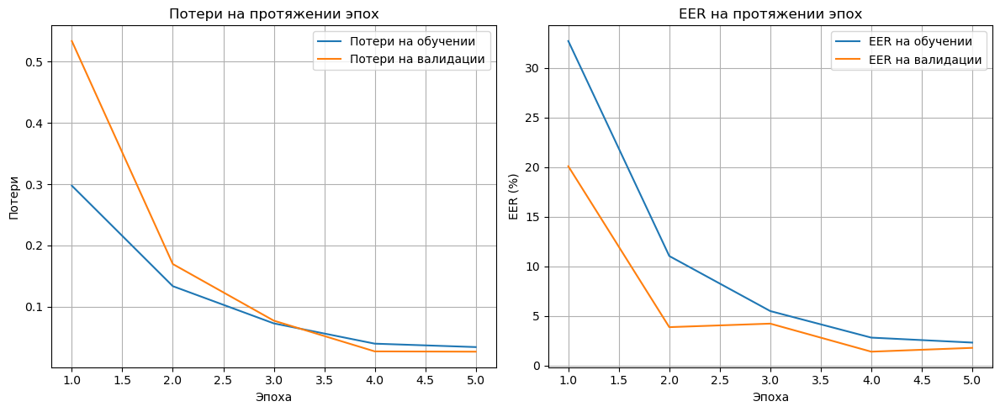

In [ ]:
import matplotlib.pyplot as plt

# Извлекаем данные из history
epochs = range(1, len(history['train_loss']) + 1)

# График потерь
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_loss'], label='Потери на обучении')
plt.plot(epochs, history['eval_loss'], label='Потери на валидации')
plt.title('Потери на протяжении эпох')
plt.xlabel('Эпоха')
plt.ylabel('Потери')
plt.legend()
plt.grid(True)

# График EER
plt.subplot(1, 2, 2)
# EER в history уже в долях, для графика лучше перевести в проценты
plt.plot(epochs, [eer * 100 for eer in history['train_eer']], label='EER на обучении')
plt.plot(epochs, [eer * 100 for eer in history['eval_eer']], label='EER на валидации')
plt.title('EER на протяжении эпох')
plt.xlabel('Эпоха')
plt.ylabel('EER (%)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

На 4й эпохе на dev датасете была достигнута лучшая EER = 1.41%. Восстановим эту модель.

In [ ]:
import torch

# Инициализируем новую модель LCNN
# num_freq_bins по умолчанию 201, что соответствует n_fft=400 из Dataset
loaded_model = LCNN().to(device)

# Загружаем сохраненные веса
try:
    loaded_model.load_state_dict(torch.load('best_lcnn_model.pth'))
    print("Веса лучшей модели успешно загружены!")
except FileNotFoundError:
    print("Ошибка: Файл 'best_lcnn_model.pth' не найден. Убедитесь, что модель была сохранена.")
except Exception as e:
    print(f"Произошла ошибка при загрузке весов модели: {e}")

loaded_model.eval()

Веса лучшей модели успешно загружены!


LCNN(
  (conv_layers): Sequential(
    (0): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): MaxFeatureMap2D()
    (2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1))
    (4): MaxFeatureMap2D()
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (6): Conv2d(32, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): MaxFeatureMap2D()
    (8): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (9): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (10): Conv2d(48, 96, kernel_size=(1, 1), stride=(1, 1))
    (11): MaxFeatureMap2D()
    (12): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (13): Conv2d(48, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): MaxFeatureMap2D()
    (15): MaxPool2d(kern

Теперь посчитаем EER модели на тестовом датасете. Оказалось, что несмотря на то, что по EER на dev датасете лучшая модель была на 4й эпохе, на eval датасете модель пятой эпохи работает лучше. Поэтому её и посчитаем.

In [ ]:
torch.save(model.state_dict(), 'best_lcnn_model_epoch5.pth')

In [ ]:
import torch

# Убедимся, что модель находится в режиме оценки
model.eval()

# Вычисляем EER и потери на eval_dataloader
eval_loss, eval_eer = evaluate(model, eval_dataloader, criterion, device)

print(f"EER на eval датасете для model пятой эпохи: {eval_eer*100:.2f}%")
print(f"Потери на eval датасете для model пятой эпохи: {eval_loss:.4f}")

Оценка:   0%|          | 0/8905 [00:00<?, ?it/s]

EER на eval датасете для model пятой эпохи: 2.73%
Потери на eval датасете для model пятой эпохи: 0.0445


Ура! EER на тестовом датасете составила всего **2.73%**. Что интересно, это меньше, чем в референсной статье https://arxiv.org/abs/1904.05576, там **4.53%** . Возможно, это потому, что у них дропаут перед последним линейным слоем, а у нас перед всем линейным блоком, и это позволило уменьшить переобучение (у них метрики на dev и train значительно лучше, чем у нас, а на eval у нас лучше).

## XAI [See points below]

Let's analyse the model we have created. We won't be able to understand the differences easily without having some reference. So, we will use the novel idea from the recent [Interspeech 2025 paper](https://arxiv.org/abs/2506.03425).

We will use a [vocoded dataset](https://arxiv.org/abs/2210.10570) of parallel samples: real and fake audio have the same speaker saying the same content at the same time. The ground-truth explanation will be obtained by calculating difference between real and fake spectrograms.

In [ ]:
if not os.path.exists('project09-voc.v4.tar'):
    !wget https://zenodo.org/records/7314976/files/project09-voc.v4.tar?download=1 -O project09-voc.v4.tar
    !tar -xvf project09-voc.v4.tar

Выходные данные были обрезаны до нескольких последних строк (5000).
voc.v4/wav/waveglow_LA_D_4338785.wav
voc.v4/wav/hifigan_LA_T_4254409.wav
voc.v4/wav/waveglow_LA_T_1226390.wav
voc.v4/wav/hifigan_LA_T_5100132.wav
voc.v4/wav/hifigan_LA_D_2248106.wav
voc.v4/wav/waveglow_LA_T_6946670.wav
voc.v4/wav/waveglow_LA_T_5837486.wav
voc.v4/wav/hn-sinc-nsf-hifi_LA_D_7919190.wav
voc.v4/wav/hn-sinc-nsf_LA_T_6082136.wav
voc.v4/wav/waveglow_LA_D_1884465.wav
voc.v4/wav/waveglow_LA_T_6258131.wav
voc.v4/wav/hn-sinc-nsf_LA_D_7948554.wav
voc.v4/wav/hifigan_LA_D_3064595.wav
voc.v4/wav/waveglow_LA_T_5061172.wav
voc.v4/wav/waveglow_LA_D_2303609.wav
voc.v4/wav/hn-sinc-nsf-hifi_LA_T_7279842.wav
voc.v4/wav/hn-sinc-nsf_LA_D_3808406.wav
voc.v4/wav/hn-sinc-nsf-hifi_LA_T_9010570.wav
voc.v4/wav/hifigan_LA_T_3026599.wav
voc.v4/wav/hn-sinc-nsf-hifi_LA_D_5000705.wav
voc.v4/wav/waveglow_LA_T_6864430.wav
voc.v4/wav/waveglow_LA_T_1477639.wav
voc.v4/wav/hn-sinc-nsf-hifi_LA_T_7974410.wav
voc.v4/wav/hn-sinc-nsf-hifi_LA_T_7208

Note that real audio is taken from ASVspoof. So let's take a real example from the asvspoof dataset. Using its filename, find the corresponding `hifi-gan` and `waveglow` vocoded versions in the vocv4 and load them too

In reality, we are interested in the explanations for the unseen data. But for this homework, let's consider the train set. This will allow us to see if the model learns the futures we expect it to learn (assuming the XAI tool is trustworthy) (Though spoof part of vocv4 is not exactly the same as the one in asvspoof, so we mostly eliminate the issues related to changing speakers, not algorithms)

In [ ]:
# for consistency with solutions choose the index that corresponds to LA_T_4179989 (bona fide)
train_dataset = ASVspoof19Dataset(root_dir=root_dir, subset="train", return_stft=True, return_mel=False, return_waveform=True)
filename_to_find = 'LA_T_4179989'
ind = -1
for i, (filename, label) in enumerate(train_dataset.data):
    if filename == filename_to_find:
        ind = i
        break

if ind != -1:
    print(f"Индекс для файла {filename_to_find}: {ind}")
else:
    print(f"Файл {filename_to_find} не найден в train_dataset.")


Индекс для файла LA_T_4179989: 50


In [ ]:
import torchaudio
import torch
import os
import torch.nn.functional as F

# Helper function to preprocess audio based on dataset's internal transforms
def preprocess_audio_for_lcnn(audio_path, dataset_instance):
    waveform, sr = torchaudio.load(audio_path)

    # Resample if needed
    if sr != dataset_instance.sample_rate:
        # Create a new resampler or reuse if already created for this SR
        # using a dedicated resampler instance for XAI context to avoid conflicts
        if not hasattr(dataset_instance, '_resampler_for_xai') or dataset_instance._resampler_for_xai.orig_freq != sr:
            dataset_instance._resampler_for_xai = torchaudio.transforms.Resample(orig_freq=sr, new_freq=dataset_instance.sample_rate)
        waveform = dataset_instance._resampler_for_xai(waveform)

    # Convert to mono if stereo
    if waveform.shape[0] > 1:
        waveform = waveform[0].unsqueeze(0)

    # Apply STFT transform
    power_spectrogram = dataset_instance.spectrogram_transform(waveform)
    log_power_spectrogram = torch.log10(power_spectrogram + 1e-6)

    # Truncate to stft_max_frames if longer
    if dataset_instance.stft_max_frames and log_power_spectrogram.shape[1] > dataset_instance.stft_max_frames:
        log_power_spectrogram = log_power_spectrogram[:, :dataset_instance.stft_max_frames]
    # Pad to stft_max_frames if shorter
    elif dataset_instance.stft_max_frames and log_power_spectrogram.shape[1] < dataset_instance.stft_max_frames:
        padding_needed = dataset_instance.stft_max_frames - log_power_spectrogram.shape[1]
        # Pad along the time dimension (last dimension)
        log_power_spectrogram = F.pad(log_power_spectrogram, (0, padding_needed))

    return log_power_spectrogram.squeeze(0), waveform.squeeze(0) # Return STFT (freq_bins, time_frames) and waveform (num_samples)


# get LCNN-prepared spectrogram for the paired real and fake example from the dataset
# paired: the same filename, but one is bona fide another is created via vocoder

# Get the real audio sample from the train_dataset using the found index
real_sample = train_dataset[ind]
real_stft_processed = real_sample['stft'] # This is (freq_bins, time_frames) and already truncated/padded by __getitem__
real_waveform_processed = real_sample['waveform']

# Define paths for fake audio files
voc_base_dir = 'voc.v4/wav/'
filename_to_find = 'LA_T_4179989' # Re-using from previous cell for clarity

hifigan_path = os.path.join(voc_base_dir, f'hifigan_{filename_to_find}.wav')
waveglow_path = os.path.join(voc_base_dir, f'waveglow_{filename_to_find}.wav')

# Preprocess fake audios using the helper function
hifigan_stft_processed, hifigan_waveform_processed = preprocess_audio_for_lcnn(hifigan_path, train_dataset)
waveglow_stft_processed, waveglow_waveform_processed = preprocess_audio_for_lcnn(waveglow_path, train_dataset)


# fake audio may be slightly longer due to padding, remove some part from the end to make the length equal
# The preprocess_audio_for_lcnn function already handles truncation and padding
# to the dataset's `stft_max_frames` parameter, ensuring consistent lengths.

# preprocess audio for model input
# Add batch and channel dimensions for model input and move to device
real_audio = real_stft_processed.unsqueeze(0).unsqueeze(0).to(device)
hifigan_audio = hifigan_stft_processed.unsqueeze(0).unsqueeze(0).to(device)
waveglow_audio = waveglow_stft_processed.unsqueeze(0).unsqueeze(0).to(device)

print(f"Размер STFT для оригинала (вход модели): {real_audio.shape}")
print(f"Размер STFT для HifiGAN (вход модели): {hifigan_audio.shape}")
print(f"Размер STFT для WaveGlow (вход модели): {waveglow_audio.shape}")


Размер STFT для оригинала (вход модели): torch.Size([1, 1, 600, 355])
Размер STFT для HifiGAN (вход модели): torch.Size([1, 1, 600, 355])
Размер STFT для WaveGlow (вход модели): torch.Size([1, 1, 600, 355])


Run your model on these clips. See if the model prediction is correct. Use this understanding for the following analysis

In [ ]:
import torch.nn.functional as F
import IPython.display as ipd # Импортируем для воспроизведения аудио

# Убедимся, что модель находится в режиме оценки
model.eval()

# Словарь для сопоставления меток
class_labels = {0: 'Bonafide', 1: 'Spoof'}

# --- Оригинальное аудио ---
with torch.no_grad():
    real_logits = model(real_audio)
    real_probabilities = F.softmax(real_logits, dim=1)
    real_predicted_class_idx = torch.argmax(real_probabilities, dim=1).item()
    real_predicted_label = class_labels[real_predicted_class_idx]

print(f"Оригинал ({filename_to_find}):")
print(f"  Логиты: {real_logits.cpu().numpy()}")
print(f"  Вероятности (Bonafide, Spoof): {real_probabilities.cpu().numpy()}")
print(f"  Предсказанный класс: {real_predicted_label}")
print(f"  Истинный класс: {class_labels[0]} (Bonafide)")
print("Аудио:")
display(ipd.Audio(real_waveform_processed.cpu().numpy(), rate=train_dataset.sample_rate))
print("\n")

# --- HifiGAN аудио ---
with torch.no_grad():
    hifigan_logits = model(hifigan_audio)
    hifigan_probabilities = F.softmax(hifigan_logits, dim=1)
    hifigan_predicted_class_idx = torch.argmax(hifigan_probabilities, dim=1).item()
    hifigan_predicted_label = class_labels[hifigan_predicted_class_idx]

print(f"HifiGAN ({filename_to_find}):")
print(f"  Логиты: {hifigan_logits.cpu().numpy()}")
print(f"  Вероятности (Bonafide, Spoof): {hifigan_probabilities.cpu().numpy()}")
print(f"  Предсказанный класс: {hifigan_predicted_label}")
print(f"  Истинный класс: {class_labels[1]} (Spoof)")
print("Аудио:")
display(ipd.Audio(hifigan_waveform_processed.cpu().numpy(), rate=train_dataset.sample_rate))
print("\n")

# --- WaveGlow аудио ---
with torch.no_grad():
    waveglow_logits = model(waveglow_audio)
    waveglow_probabilities = F.softmax(waveglow_logits, dim=1)
    waveglow_predicted_class_idx = torch.argmax(waveglow_probabilities, dim=1).item()
    waveglow_predicted_label = class_labels[waveglow_predicted_class_idx]

print(f"WaveGlow ({filename_to_find}):")
print(f"  Логиты: {waveglow_logits.cpu().numpy()}")
print(f"  Вероятности (Bonafide, Spoof): {waveglow_probabilities.cpu().numpy()}")
print(f"  Предсказанный класс: {waveglow_predicted_label}")
print(f"  Истинный класс: {class_labels[1]} (Spoof)")
print("Аудио:")
display(ipd.Audio(waveglow_waveform_processed.cpu().numpy(), rate=train_dataset.sample_rate))
print("\n")

Оригинал (LA_T_4179989):
  Логиты: [[ 2.744135  -2.0847082]]
  Вероятности (Bonafide, Spoof): [[0.9920677  0.00793234]]
  Предсказанный класс: Bonafide
  Истинный класс: Bonafide (Bonafide)
Аудио:




HifiGAN (LA_T_4179989):
  Логиты: [[ 1.249163  -1.2982106]]
  Вероятности (Bonafide, Spoof): [[0.9273969  0.07260311]]
  Предсказанный класс: Bonafide
  Истинный класс: Spoof (Spoof)
Аудио:




WaveGlow (LA_T_4179989):
  Логиты: [[-0.894816   1.3032057]]
  Вероятности (Bonafide, Spoof): [[0.09992829 0.9000717 ]]
  Предсказанный класс: Spoof
  Истинный класс: Spoof (Spoof)
Аудио:


Звучит вообще одинаково... И насчет HifiGAN модель ошиблась.

### Manual explanation [0.5 pts]

Compare the two spectrograms (real and fake). What differences do you see? (**Hint**: they exist, if you do not see -- look carefully).

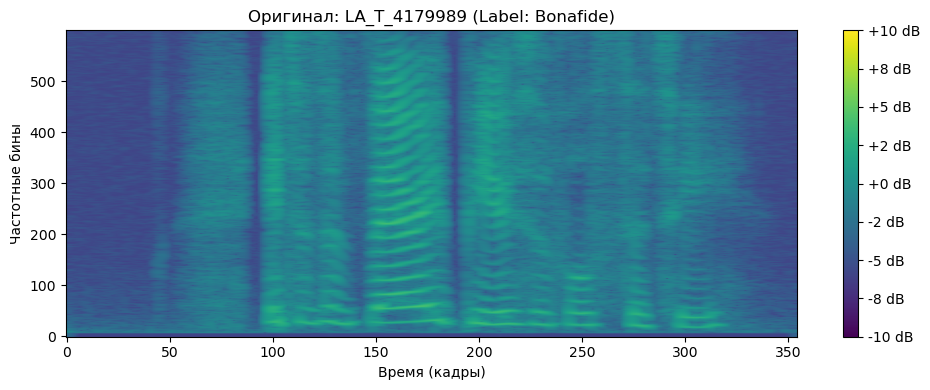

Аудио:


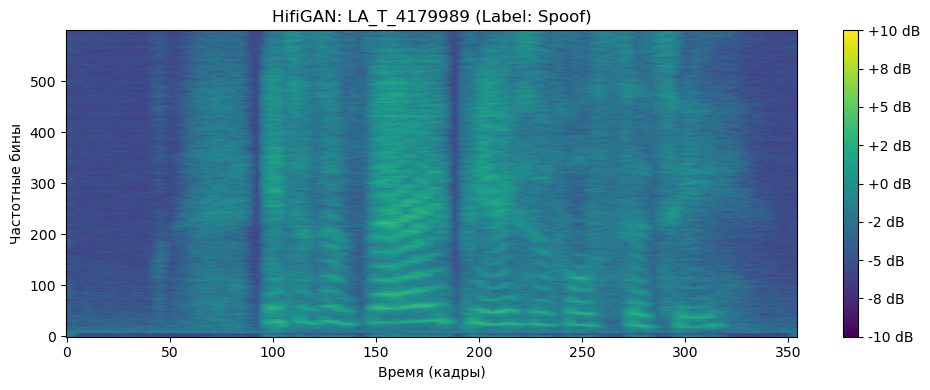

Аудио:


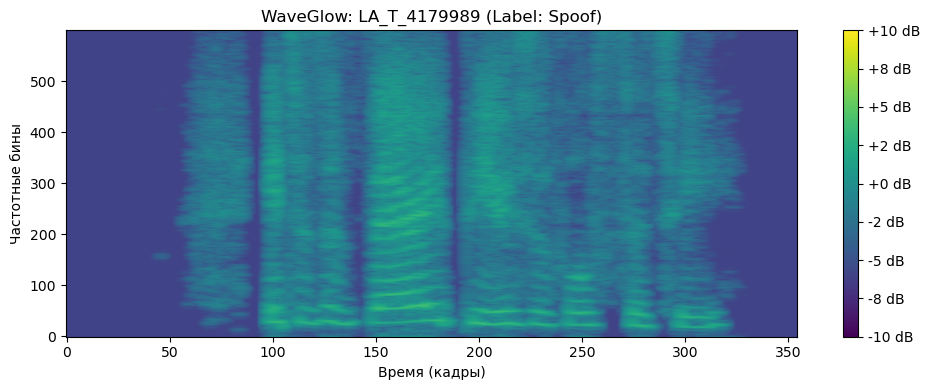

Аудио:


In [ ]:
import matplotlib.pyplot as plt
import IPython.display as ipd
import numpy as np

def plot_spectrogram_and_audio(spectrogram, waveform, sample_rate, label, title):
    plt.figure(figsize=(10, 4))
    # Ensure spectrogram is 2D for imshow, removing batch/channel dimensions if present
    if spectrogram.ndim == 3: # (channel, freq, time) or (freq, time, channel)
        spectrogram_2d = spectrogram.squeeze() # Assuming channel dim is 1 or removed by squeeze(0) in dataset
    elif spectrogram.ndim == 4: # (batch, channel, freq, time)
        spectrogram_2d = spectrogram.squeeze(0).squeeze(0) # Remove batch and channel
    else:
        spectrogram_2d = spectrogram

    plt.imshow(spectrogram_2d.cpu().numpy(), aspect='auto', origin='lower',
               cmap='viridis', vmin=-10, vmax=10)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"{title} (Label: {'Spoof' if label == 1 else 'Bonafide'})")
    plt.xlabel("Время (кадры)")
    plt.ylabel("Частотные бины")
    plt.tight_layout()
    plt.show()
    print("Аудио:")
    display(ipd.Audio(waveform.cpu().numpy(), rate=sample_rate))

# Оригинальное аудио
plot_spectrogram_and_audio(
    real_stft_processed, # Spectrogram (freq_bins, time_frames)
    real_waveform_processed, # Waveform (num_samples)
    train_dataset.sample_rate,
    0, # True label for original is Bonafide (0)
    f"Оригинал: {filename_to_find}"
)

# HifiGAN аудио
plot_spectrogram_and_audio(
    hifigan_stft_processed, # Spectrogram (freq_bins, time_frames)
    hifigan_waveform_processed, # Waveform (num_samples)
    train_dataset.sample_rate,
    1, # True label for HifiGAN is Spoof (1)
    f"HifiGAN: {filename_to_find}"
)

# WaveGlow аудио
plot_spectrogram_and_audio(
    waveglow_stft_processed, # Spectrogram (freq_bins, time_frames)
    waveglow_waveform_processed, # Waveform (num_samples)
    train_dataset.sample_rate,
    1, # True label for WaveGlow is Spoof (1)
    f"WaveGlow: {filename_to_find}"
)


**Your answer here**

У WaveGlow гораздо более чистая запись, практически нет шума в начале и конце записи. У HifiGAN наиболее размазанные частоты, в оригинале гармоники более четкие.

### Automatic explanation. [0.5 pts]

Calculate Eq. 2 from the [Interspeech 2025 paper](https://arxiv.org/abs/2506.03425) to automatically highlight the differences between two objects

In [ ]:
import torch

def calculate_diff_mask(real_spectrogram, fake_spectrogram):
    """
    Вычисляет абсолютную разницу между двумя спектрограммами.
    Предполагается, что спектрограммы имеют одинаковые размеры (freq_bins, time_frames).

    Аргументы:
        real_spectrogram (torch.Tensor): Спектрограмма реального аудио.
        fake_spectrogram (torch.Tensor): Спектрограмма поддельного аудио.

    Возвращает:
        torch.Tensor: Маска абсолютной разницы.
    """
    # Убедимся, что спектрограммы имеют одинаковый размер
    if real_spectrogram.shape != fake_spectrogram.shape:
        # В случае несовпадения размеров, возможно, потребуется дополнительная обработка (например, обрезка/дополнение)
        # Но для этой задачи предположим, что они уже выровнены благодаря Dataset
        print("Предупреждение: Размеры спектрограмм не совпадают. Разница может быть некорректной.")
        # Для этой задачи мы будем использовать минимальный размер
        min_freq_bins = min(real_spectrogram.shape[0], fake_spectrogram.shape[0])
        min_time_frames = min(real_spectrogram.shape[1], fake_spectrogram.shape[1])
        real_spectrogram = real_spectrogram[:min_freq_bins, :min_time_frames]
        fake_spectrogram = fake_spectrogram[:min_freq_bins, :min_time_frames]

    # Вычисляем абсолютную разницу
    diff_mask = torch.abs(real_spectrogram - fake_spectrogram)

    return diff_mask


# Вычисляем маску разницы для HifiGAN
hifigan_diff_mask = calculate_diff_mask(real_stft_processed, hifigan_stft_processed)

# Вычисляем маску разницы для WaveGlow
waveglow_diff_mask = calculate_diff_mask(real_stft_processed, waveglow_stft_processed)

print(f"Размер маски разницы HifiGAN: {hifigan_diff_mask.shape}")
print(f"Размер маски разницы WaveGlow: {waveglow_diff_mask.shape}")


Размер маски разницы HifiGAN: torch.Size([600, 355])
Размер маски разницы WaveGlow: torch.Size([600, 355])


Plot the mask on top of the fake spectrogram and compare three plots: real, fake, fake+mask on top. Do it for both vocoders. Compare

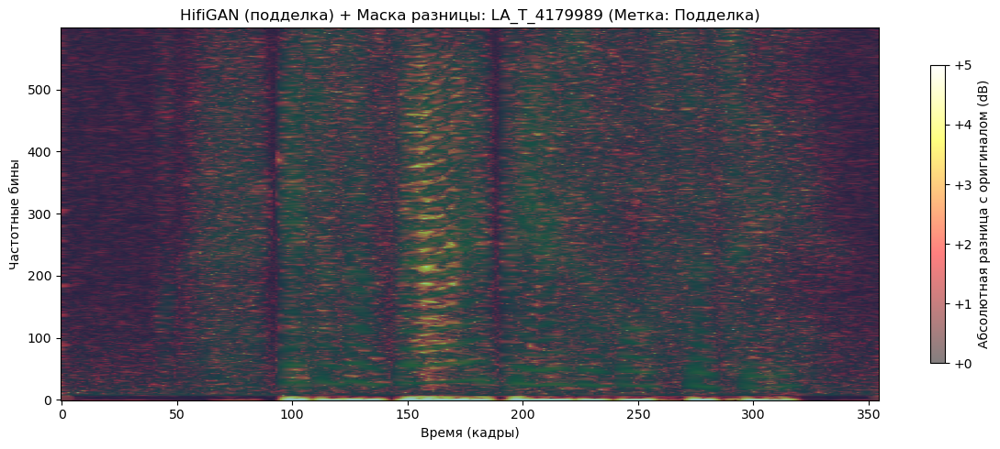

Аудио:


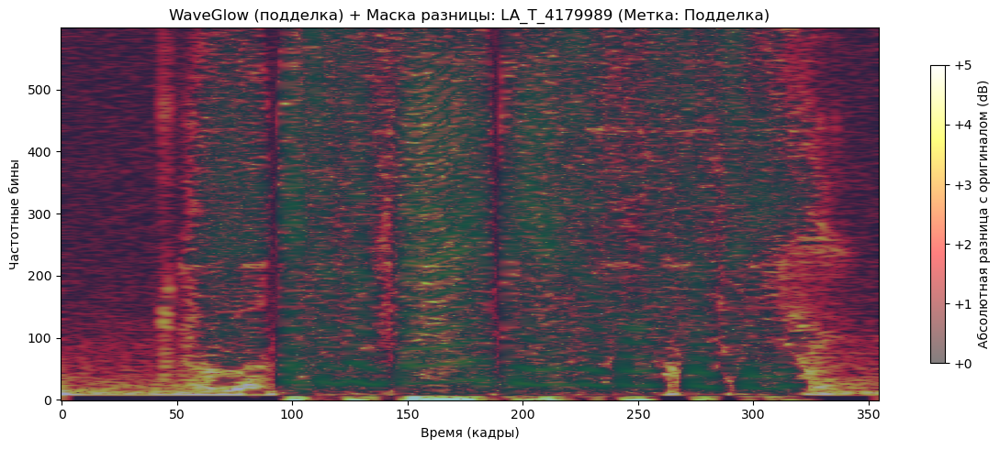

Аудио:


In [ ]:
import matplotlib.pyplot as plt
import IPython.display as ipd
import numpy as np
import torch

def plot_spectrogram_with_overlay_mask(spectrogram_base, mask, waveform, sample_rate, label, title, mask_cmap='hot', mask_alpha=0.5, mask_vmin=0, mask_vmax=5, mask_colorbar_label="Разница (dB)"):
    """
    Строит базовую спектрограмму и накладывает на нее маску различий.

    Аргументы:
        spectrogram_base (torch.Tensor): Базовая спектрограмма (например, поддельная спектрограмма).
        mask (torch.Tensor): Маска различий для наложения.
        waveform (torch.Tensor): Соответствующая звуковая волна для воспроизведения.
        sample_rate (int): Частота дискретизации аудио.
        label (int): Метка (0 для Bonafide, 1 для Spoof).
        title (str): Заголовок для графика.
        mask_cmap (str): Цветовая карта для маски.
        mask_alpha (float): Уровень прозрачности для маски (от 0.0 до 1.0).
        mask_vmin (float): Минимальное значение для цветовой карты маски.
        mask_vmax (float): Максимальное значение для цветовой карты маски.
        mask_colorbar_label (str): Метка для цветовой полосы маски.
    """
    plt.figure(figsize=(12, 5))

    # Убедимся, что spectrogram_base является 2D для построения графика
    spectrogram_2d_base = spectrogram_base.squeeze().cpu().numpy()

    # Построение базовой спектрограммы
    plt.imshow(spectrogram_2d_base, aspect='auto', origin='lower',
               cmap='viridis', vmin=-10, vmax=10) # Используем те же vmin/vmax, что и ранее для STFT

    # Убедимся, что mask является 2D для построения графика
    mask_2d = mask.squeeze().cpu().numpy()

    # Построение маски сверху с прозрачностью
    im_mask = plt.imshow(mask_2d, aspect='auto', origin='lower',
                         cmap=mask_cmap, alpha=mask_alpha, vmin=mask_vmin, vmax=mask_vmax, zorder=2)

    # Добавление цветовой полосы для маски
    cbar = plt.colorbar(im_mask, format='%+2.0f', shrink=0.8)
    cbar.set_label(mask_colorbar_label)

    plt.title(f"{title} (Метка: {'Подделка' if label == 1 else 'Подлинный'})")
    plt.xlabel("Время (кадры)")
    plt.ylabel("Частотные бины")
    plt.tight_layout()
    plt.show()
    print("Аудио:")
    display(ipd.Audio(waveform.cpu().numpy(), rate=sample_rate))

# График для HifiGAN: поддельная спектрограмма с наложенной маской различий
plot_spectrogram_with_overlay_mask(
    hifigan_stft_processed,
    hifigan_diff_mask,
    hifigan_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка для HifiGAN - Подделка (1)
    f"HifiGAN (подделка) + Маска разницы: {filename_to_find}",
    mask_colorbar_label="Абсолютная разница с оригиналом (dB)"
)

# График для WaveGlow: поддельная спектрограмма с наложенной маской различий
plot_spectrogram_with_overlay_mask(
    waveglow_stft_processed,
    waveglow_diff_mask,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка для WaveGlow - Подделка (1)
    f"WaveGlow (подделка) + Маска разницы: {filename_to_find}",
    mask_colorbar_label="Абсолютная разница с оригиналом (dB)"
)

**Your comparison of the ground-truth mask with your manual analysis (from previous subtask) here**

Маски действительно подсветили те отличия, которые были наиболее заметны. Разумеется, кроме этого показали и более мелкие различия. Но при этом самые явные действительно были видны глазами.

### Grad-CAM [0.5 pts]

Using [pytorch-grad-cam lib](https://github.com/jacobgil/pytorch-grad-cam), implement [Grad-CAM](https://arxiv.org/abs/1610.02391) for your LCNN model. Choose the layer you like

In [ ]:
# grad-cam and captum may have conflicting numpy dependencies. Just install grad-cam first, then captum and it will work

In [ ]:
!pip install grad-cam

Генерация Grad-CAM для Оригинального аудио:


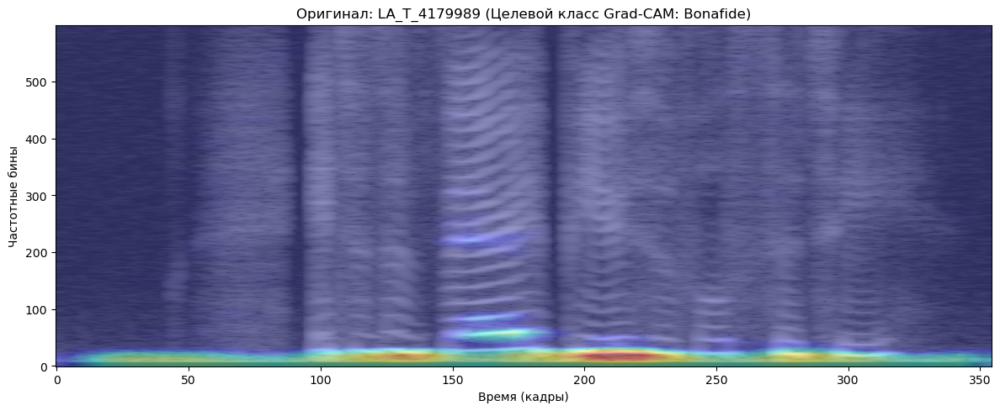

Аудио:




Генерация Grad-CAM для HifiGAN аудио:


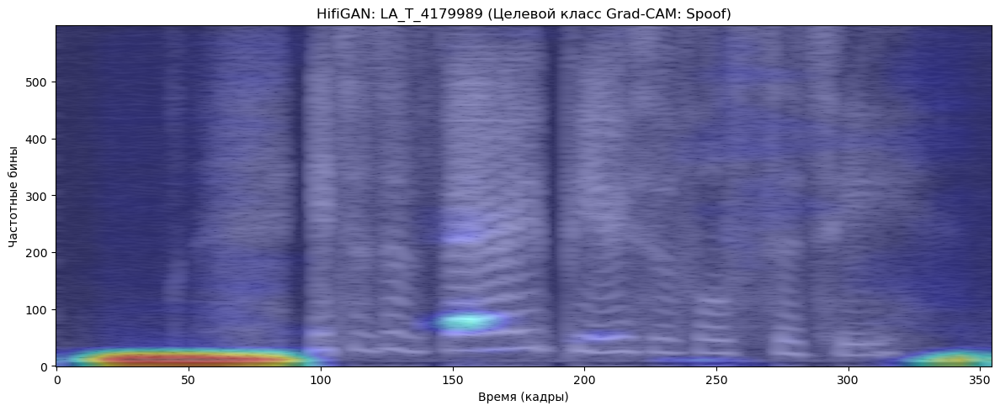

Аудио:




Генерация Grad-CAM для WaveGlow аудио:


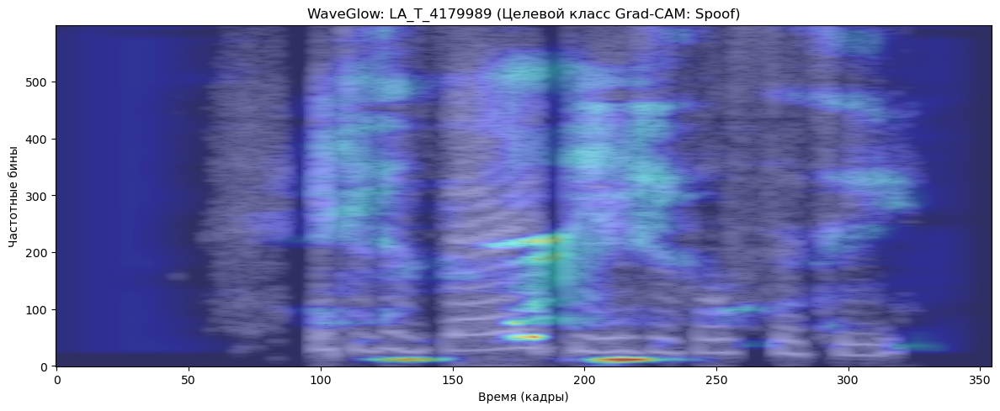

Аудио:


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import IPython.display as ipd
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget # For multi-class targets
from pytorch_grad_cam.utils.image import show_cam_on_image # Helper for overlaying

# Убедимся, что модель находится в режиме оценки
model.eval()

# Определяем целевой слой для Grad-CAM.
# Согласно структуре LCNN, последний сверточный слой находится по индексу 25 в Sequential conv_layers.
# print(model.conv_layers) # Можно раскомментировать, чтобы посмотреть структуру
target_layers = [model.conv_layers[25]]

# Создаем экземпляр GradCAM
# Используем GradCAM, так как это базовый и широко используемый метод.
# Также можно попробовать другие методы из pytorch_grad_cam (HiResCAM, ScoreCAM и т.д.)
cam = GradCAM(model=model, target_layers=target_layers)

# Функция для визуализации Grad-CAM
def visualize_grad_cam(
    spectrogram_tensor,
    waveform_tensor,
    sample_rate,
    audio_label,
    title_prefix,
    target_category_idx
):
    # Подготавливаем входной тензор для модели и Grad-CAM
    # Добавляем размерность батча и канала: (1, 1, freq_bins, time_frames)
    input_tensor = spectrogram_tensor.unsqueeze(0).unsqueeze(0).to(device)

    # Определяем цель: для какого класса хотим получить объяснение
    # ClassifierOutputTarget(target_category_idx) указывает на конкретный класс
    targets = [ClassifierOutputTarget(target_category_idx)]

    # Вычисляем Grad-CAM
    # grayscale_cam имеет размер (batch, H, W). Мы берем первый элемент батча.
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets, eigen_smooth=True)[0, :]

    # Нормализуем спектрограмму для наложения CAM
    # show_cam_on_image ожидает значения от 0 до 1, поэтому нормализуем лог-спектрограмму
    # Переводим спектрограмму в numpy и масштабируем. Сначала приводим к диапазону [min, max], затем [0, 1].
    # Используем диапазон [-10, 10] для STFT, как в предыдущих графиках
    spectrogram_np = spectrogram_tensor.squeeze().cpu().numpy()
    min_val, max_val = -10, 10 # Используем тот же диапазон, что и для imshow
    # Нормализация в [0, 1]
    normalized_spectrogram = (spectrogram_np - min_val) / (max_val - min_val)
    # При необходимости отсекаем значения вне [0, 1] после нормализации
    normalized_spectrogram = np.clip(normalized_spectrogram, 0, 1)

    # Преобразуем 1-канальную нормализованную спектрограмму в 3-канальную для show_cam_on_image
    # Это нужно, если show_cam_on_image ожидает 3 канала. В случае градации серого, можно просто повторить канал.
    rgb_img = np.stack([normalized_spectrogram, normalized_spectrogram, normalized_spectrogram], axis=-1)

    # Накладываем CAM на изображение
    # Увеличиваем контраст CAM для лучшей видимости
    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True, image_weight=0.7)

    # Визуализация
    plt.figure(figsize=(12, 5))
    plt.imshow(cam_image, aspect='auto', origin='lower')

    # Указываем целевой класс в заголовке
    class_name = 'Bonafide' if target_category_idx == 0 else 'Spoof'
    plt.title(f"{title_prefix} (Целевой класс Grad-CAM: {class_name})")
    plt.xlabel("Время (кадры)")
    plt.ylabel("Частотные бины")
    plt.tight_layout()
    plt.show()
    print("Аудио:")
    display(ipd.Audio(waveform_tensor.cpu().numpy(), rate=sample_rate))
    print("\n")

# Словарь для сопоставления меток для отображения
class_labels = {0: 'Bonafide', 1: 'Spoof'}

# --- Визуализация Grad-CAM для Оригинального аудио ---
# Оригинал - истинный класс 'Bonafide' (0)
# Предсказанный класс для HifiGAN был 'Bonafide', но истинный 'Spoof'

print("Генерация Grad-CAM для Оригинального аудио:")
visualize_grad_cam(
    real_stft_processed,
    real_waveform_processed,
    train_dataset.sample_rate,
    0, # Истинная метка 'Bonafide'
    f"Оригинал: {filename_to_find}",
    0 # Целевой класс Grad-CAM: Bonafide
)

print("Генерация Grad-CAM для HifiGAN аудио:")
visualize_grad_cam(
    hifigan_stft_processed,
    hifigan_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"HifiGAN: {filename_to_find}",
    1 # Целевой класс Grad-CAM: Spoof (поскольку это подделка)
)

print("Генерация Grad-CAM для WaveGlow аудио:")
visualize_grad_cam(
    waveglow_stft_processed,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"WaveGlow: {filename_to_find}",
    1 # Целевой класс Grad-CAM: Spoof (поскольку это подделка)
)

Grad-CAM показывает результаты, отличные от замеченных на визуале

### Comparison [1.0 pts]

Compare your Grad-CAM attributions with another gradient-based method: InputXGradient. Compute it using [Captum](https://captum.ai/).

In [ ]:
!pip install captum

Генерация InputXGradient для Оригинального аудио (целевой Bonafide):


/home/dukei/anaconda3/lib/python3.13/site-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


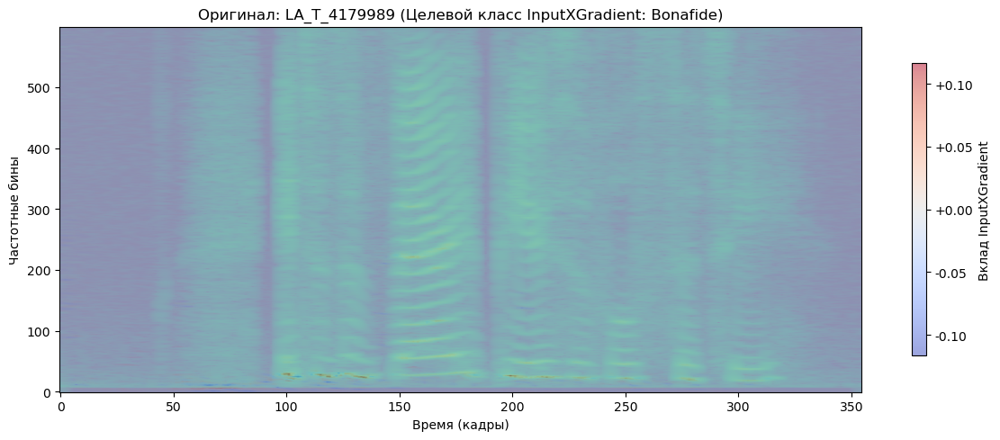

Аудио:




Генерация InputXGradient для HifiGAN аудио (целевой Spoof):


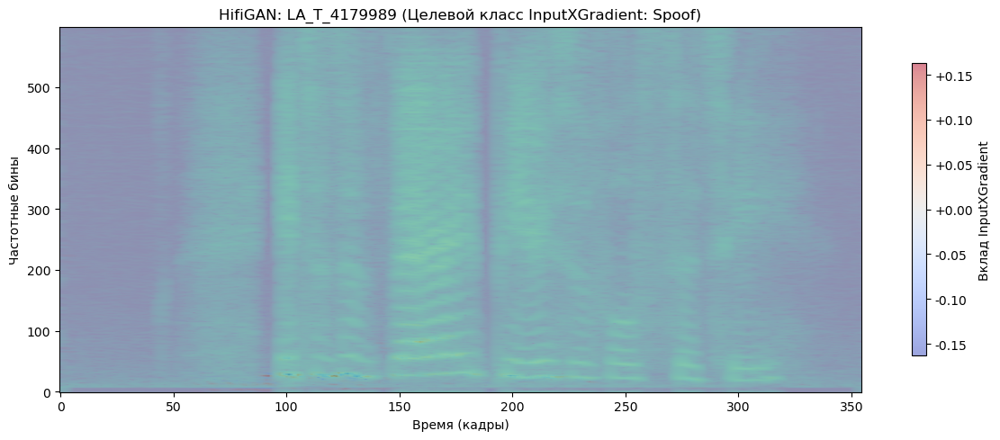

Аудио:




Генерация InputXGradient для WaveGlow аудио (целевой Spoof):


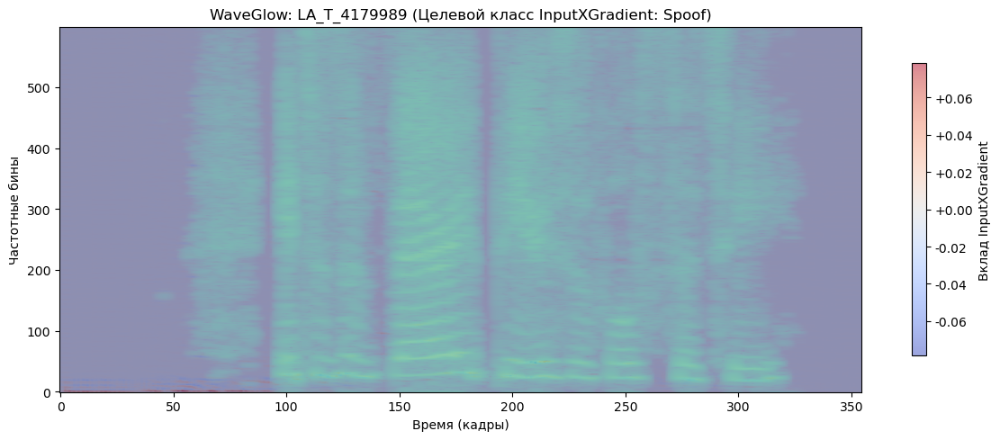

Аудио:


In [ ]:
# Установка captum (если еще не установлено)
# !pip install captum

import matplotlib.pyplot as plt
import numpy as np
import torch
import IPython.display as ipd
from captum.attr import InputXGradient

# Убедимся, что модель находится в режиме оценки
model.eval()

# Инициализируем InputXGradient. Он работает напрямую с моделью.
# Target_layers не нужны, так как атрибуция идет по входным данным.
ig = InputXGradient(model)

# Функция для визуализации атрибуций Captum (похожа на visualize_grad_cam)
def visualize_captum_attributions(
    attributions,
    spectrogram_tensor,
    waveform_tensor,
    sample_rate,
    audio_label,
    title_prefix,
    target_category_idx,
    attr_cmap='coolwarm', # Дивергентная цветовая карта для положительных/отрицательных вкладов
    attr_alpha=0.5
):
    plt.figure(figsize=(12, 5))

    # Базовая спектрограмма для фона
    spectrogram_np = spectrogram_tensor.squeeze().detach().cpu().numpy()
    plt.imshow(spectrogram_np, aspect='auto', origin='lower',
               cmap='viridis', vmin=-10, vmax=10)

    # Атрибуции Captum. Могут быть положительными или отрицательными.
    attributions_np = attributions.squeeze().detach().cpu().numpy()

    # Нормализуем атрибуции для визуализации и центрируем цветовую карту на 0
    max_abs_attr = np.max(np.abs(attributions_np))
    if max_abs_attr == 0: # Избегаем деления на ноль, если все атрибуции нулевые
        v_min_attr, v_max_attr = -1, 1
    else:
        v_min_attr, v_max_attr = -max_abs_attr, max_abs_attr

    im_attr = plt.imshow(attributions_np, aspect='auto', origin='lower',
                         cmap=attr_cmap, alpha=attr_alpha,
                         vmin=v_min_attr, vmax=v_max_attr, zorder=2)

    cbar = plt.colorbar(im_attr, format='%+2.2f', shrink=0.8)
    cbar.set_label("Вклад InputXGradient")

    class_name = 'Bonafide' if target_category_idx == 0 else 'Spoof'
    plt.title(f"{title_prefix} (Целевой класс InputXGradient: {class_name})")
    plt.xlabel("Время (кадры)")
    plt.ylabel("Частотные бины")
    plt.tight_layout()
    plt.show()
    print("Аудио:")
    display(ipd.Audio(waveform_tensor.cpu().numpy(), rate=sample_rate))
    print("\n")

# --- Визуализация InputXGradient для Оригинального аудио ---
# Оригинал - истинный класс 'Bonafide' (0)
print("Генерация InputXGradient для Оригинального аудио (целевой Bonafide):")
input_tensor_real = real_stft_processed.unsqueeze(0).unsqueeze(0).to(device)
attributions_real_bonafide = ig.attribute(input_tensor_real, target=0)
visualize_captum_attributions(
    attributions_real_bonafide,
    real_stft_processed,
    real_waveform_processed,
    train_dataset.sample_rate,
    0, # Истинная метка 'Bonafide'
    f"Оригинал: {filename_to_find}",
    0 # Целевой класс InputXGradient: Bonafide
)

# --- Визуализация InputXGradient для HifiGAN аудио ---
# HifiGAN - истинный класс 'Spoof' (1)
print("Генерация InputXGradient для HifiGAN аудио (целевой Spoof):")
input_tensor_hifigan = hifigan_stft_processed.unsqueeze(0).unsqueeze(0).to(device)
attributions_hifigan_spoof = ig.attribute(input_tensor_hifigan, target=1)
visualize_captum_attributions(
    attributions_hifigan_spoof,
    hifigan_stft_processed,
    hifigan_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"HifiGAN: {filename_to_find}",
    1 # Целевой класс InputXGradient: Spoof
)

# --- Визуализация InputXGradient для WaveGlow аудио ---
# WaveGlow - истинный класс 'Spoof' (1)
print("Генерация InputXGradient для WaveGlow аудио (целевой Spoof):")
input_tensor_waveglow = waveglow_stft_processed.unsqueeze(0).unsqueeze(0).to(device)
attributions_waveglow_spoof = ig.attribute(input_tensor_waveglow, target=1)
visualize_captum_attributions(
    attributions_waveglow_spoof,
    waveglow_stft_processed,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"WaveGlow: {filename_to_find}",
    1 # Целевой класс InputXGradient: Spoof
)

Этот метод показывает совсем другие пояснения к выбору модели. По ним даже сложно сказать, что именно привело её к нужному ответу.

Do three plots: mask vs grad-cam vs inputXgradient. Compare them. Does any of the XAI methods align with the mask?

### Сравнение маски различий, Grad-CAM и InputXGradient для WaveGlow

1. Спектрограмма WaveGlow с наложенной маской различий (относительно оригинала):


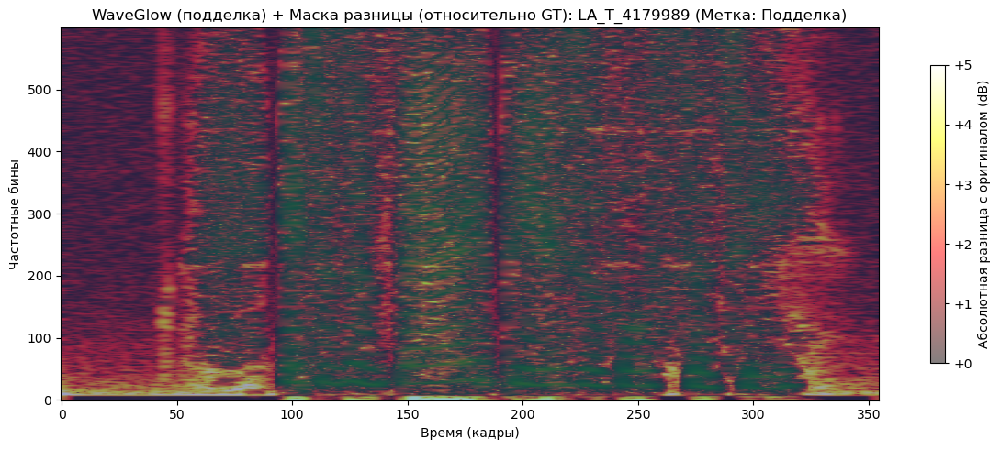

Аудио:



2. Grad-CAM для WaveGlow аудио (целевой Spoof):


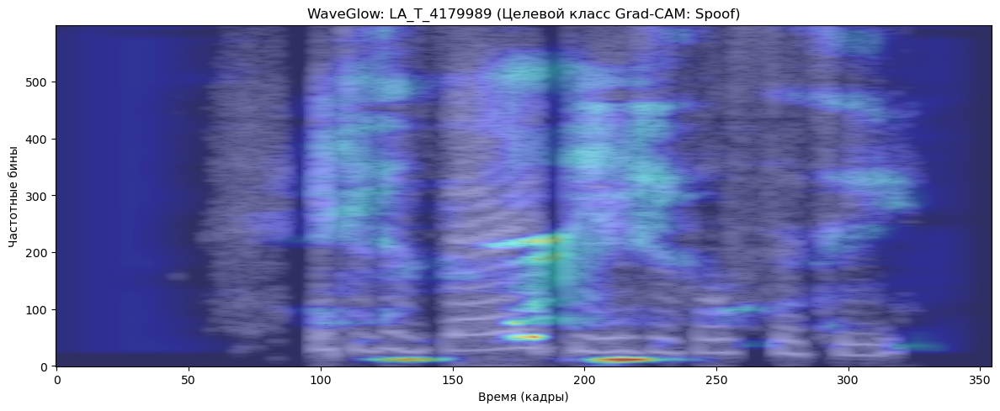

Аудио:





3. InputXGradient для WaveGlow аудио (целевой Spoof):


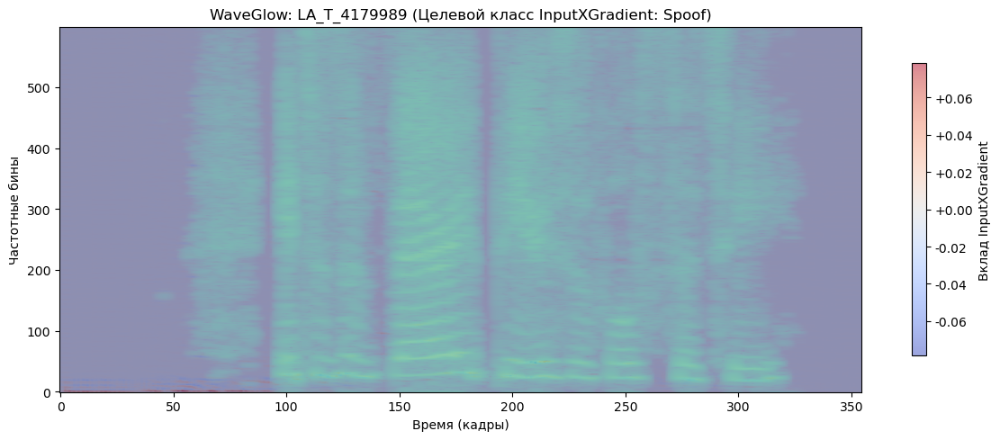

Аудио:


In [ ]:
print("1. Спектрограмма WaveGlow с наложенной маской различий (относительно оригинала):")
plot_spectrogram_with_overlay_mask(
    waveglow_stft_processed,
    waveglow_diff_mask,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка для WaveGlow - Spoof (1)
    f"WaveGlow (подделка) + Маска разницы (относительно GT): {filename_to_find}",
    mask_colorbar_label="Абсолютная разница с оригиналом (dB)"
)

print("\n2. Grad-CAM для WaveGlow аудио (целевой Spoof):")
visualize_grad_cam(
    waveglow_stft_processed,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"WaveGlow: {filename_to_find}",
    1 # Целевой класс Grad-CAM: Spoof (поскольку это подделка)
)

print("\n3. InputXGradient для WaveGlow аудио (целевой Spoof):")
visualize_captum_attributions(
    attributions_waveglow_spoof,
    waveglow_stft_processed,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"WaveGlow: {filename_to_find}",
    1 # Целевой класс InputXGradient: Spoof
)

**Your answer here**
Честно говоря, ничего общего, кроме контуров оригинальной спектрограммы, на этих графиков не видно. То есть, в данном виде этим методы дают практически полностью разные результаты.

Due to skewed distribution for some XAI tools, you may want to look at top-5% points, similarly to the ground-truth mask. Binarize attributions using their $95\%$ quantile and plot again:

1. Бинаризованная маска различий WaveGlow (топ 5%):


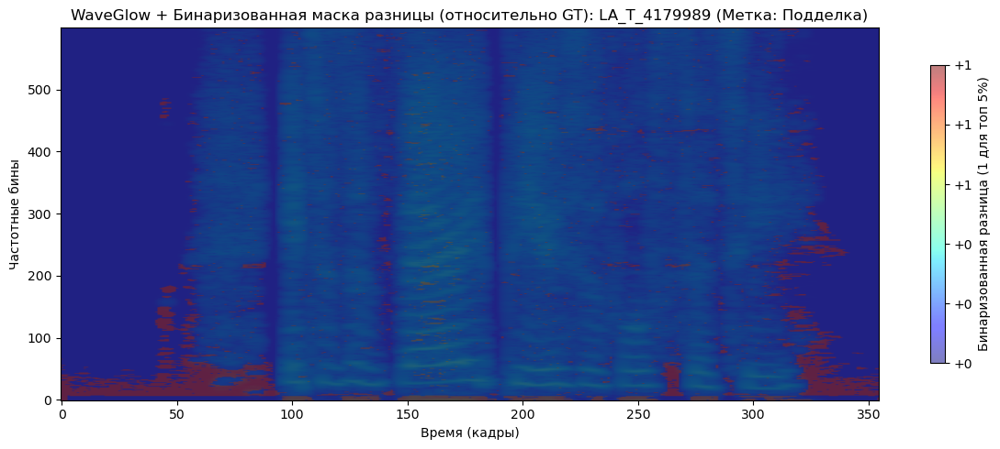

Аудио:



2. Бинаризованный Grad-CAM для WaveGlow аудио (целевой Spoof, топ 5%):


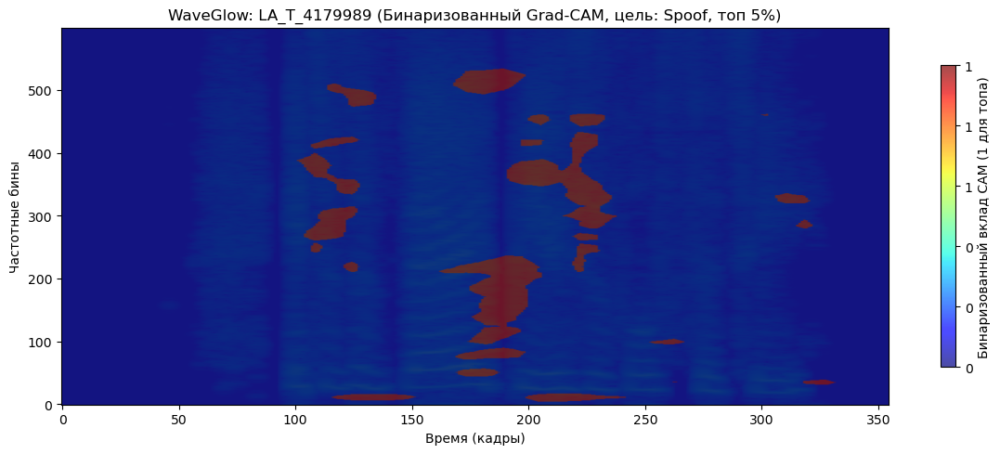

Аудио:





3. Бинаризованный InputXGradient для WaveGlow аудио (целевой Spoof, топ 5%):


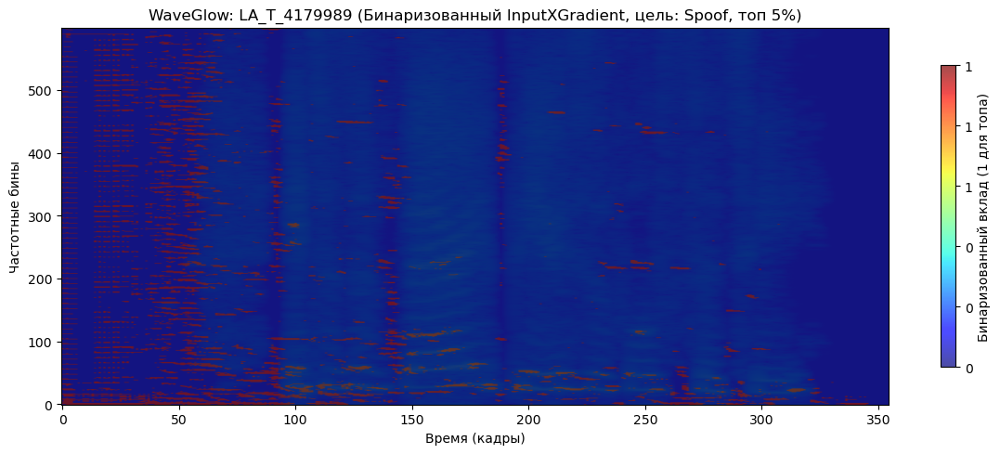

Аудио:


In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import IPython.display as ipd
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from captum.attr import InputXGradient

# --- Функции для бинаризации и визуализации (адаптированные) ---

def binarize_attributions_top_k(attributions_map, percentile=95):
    # Убеждаемся, что attributions_map является тензором, и выравниваем его
    if not isinstance(attributions_map, torch.Tensor):
        attributions_map = torch.tensor(attributions_map)

    # Перемещаем на CPU и приводим к float для надежного вычисления квантиля
    flat_map_cpu = attributions_map.flatten().cpu().float()

    # Вычисляем порог на основе перцентиля
    # Если перцентиль 95, мы хотим значения в топ 5%, что означает >= 95-го перцентиля
    threshold = torch.quantile(flat_map_cpu, percentile / 100.0)

    # Создаем бинарную маску: значения выше порога равны 1, остальные 0
    # Применяем порог обратно на исходном устройстве, если он был на GPU
    binarized_map = (attributions_map >= threshold.to(attributions_map.device)).float()
    return binarized_map

def visualize_binarized_grad_cam(
    spectrogram_tensor,
    waveform_tensor,
    sample_rate,
    audio_label,
    title_prefix,
    target_category_idx,
    percentile=95,
    cam_cmap='jet', # Хорошо для бинаризованных CAM
    cam_alpha=0.7 # Увеличена прозрачность, чтобы CAM был более заметным
):
    # Пересчитываем Grad-CAM для обеспечения свежих атрибуций
    model.eval()
    target_layers = [model.conv_layers[25]]
    cam_instance = GradCAM(model=model, target_layers=target_layers)
    input_tensor = spectrogram_tensor.unsqueeze(0).unsqueeze(0).to(device)
    targets = [ClassifierOutputTarget(target_category_idx)]
    # grayscale_cam имеет размер (H, W)
    grayscale_cam = cam_instance(input_tensor=input_tensor, targets=targets, eigen_smooth=True)[0, :]

    # Бинаризуем CAM
    binarized_cam = binarize_attributions_top_k(torch.from_numpy(grayscale_cam), percentile=percentile)

    plt.figure(figsize=(12, 5))

    # Базовая спектрограмма для фона
    spectrogram_np = spectrogram_tensor.squeeze().cpu().numpy()
    plt.imshow(spectrogram_np, aspect='auto', origin='lower',
               cmap='viridis', vmin=-10, vmax=10)

    # Накладываем бинаризованный CAM
    # Теперь используем plt.imshow напрямую для наложения, чтобы избежать проблем с OpenCV
    cam_np = binarized_cam.cpu().numpy()
    im_cam = plt.imshow(cam_np, aspect='auto', origin='lower',
                         cmap=cam_cmap, alpha=cam_alpha,
                         vmin=0, vmax=1, zorder=2) # Бинаризованные значения 0 или 1

    cbar = plt.colorbar(im_cam, format='%1.0f', shrink=0.8)
    cbar.set_label("Бинаризованный вклад CAM (1 для топа)")

    class_name = 'Bonafide' if target_category_idx == 0 else 'Spoof'
    plt.title(f"{title_prefix} (Бинаризованный Grad-CAM, цель: {class_name}, топ {100-percentile}%)")
    plt.xlabel("Время (кадры)")
    plt.ylabel("Частотные бины")
    plt.tight_layout()
    plt.show()
    print("Аудио:")
    display(ipd.Audio(waveform_tensor.cpu().numpy(), rate=sample_rate))
    print("\n")

def visualize_binarized_captum_attributions(
    attributions_tensor,
    spectrogram_tensor,
    waveform_tensor,
    sample_rate,
    audio_label,
    title_prefix,
    target_category_idx,
    percentile=95,
    attr_cmap='jet', # Хорошо для бинаризованных
    attr_alpha=0.7 # Увеличена прозрачность, чтобы маска была более заметной
):
    plt.figure(figsize=(12, 5))

    # Базовая спектрограмма для фона
    spectrogram_np = spectrogram_tensor.squeeze().detach().cpu().numpy()
    plt.imshow(spectrogram_np, aspect='auto', origin='lower',
               cmap='viridis', vmin=-10, vmax=10)

    # Бинаризуем атрибуции
    binarized_attributions = binarize_attributions_top_k(attributions_tensor.squeeze().detach(), percentile=percentile)
    attributions_np = binarized_attributions.cpu().numpy()

    # Строим бинаризованную маску
    im_attr = plt.imshow(attributions_np, aspect='auto', origin='lower',
                         cmap=attr_cmap, alpha=attr_alpha,
                         vmin=0, vmax=1, zorder=2) # Бинаризованные значения 0 или 1

    cbar = plt.colorbar(im_attr, format='%1.0f', shrink=0.8)
    cbar.set_label("Бинаризованный вклад (1 для топа)")

    class_name = 'Bonafide' if target_category_idx == 0 else 'Spoof'
    plt.title(f"{title_prefix} (Бинаризованный InputXGradient, цель: {class_name}, топ {100-percentile}%)")
    plt.xlabel("Время (кадры)")
    plt.ylabel("Частотные бины")
    plt.tight_layout()
    plt.show()
    print("Аудио:")
    display(ipd.Audio(waveform_tensor.cpu().numpy(), rate=sample_rate))
    print("\n")


# --- Вычисляем и визуализируем бинаризованные маски для WaveGlow ---

print("1. Бинаризованная маска различий WaveGlow (топ 5%):")
# Для маски различий уже есть calculate_diff_mask и plot_spectrogram_with_overlay_mask.
# Чтобы ее бинаризовать, сначала применяем binarize_attributions_top_k к waveglow_diff_mask
binarized_waveglow_diff_mask = binarize_attributions_top_k(waveglow_diff_mask, percentile=95)
plot_spectrogram_with_overlay_mask(
    waveglow_stft_processed,
    binarized_waveglow_diff_mask,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1,
    f"WaveGlow + Бинаризованная маска разницы (относительно GT): {filename_to_find}",
    mask_cmap='jet', # Изменяем цветовую карту для бинаризованной маски
    mask_vmin=0, mask_vmax=1, # Для бинаризованных значений
    mask_colorbar_label="Бинаризованная разница (1 для топ 5%)"
)

print("\n2. Бинаризованный Grad-CAM для WaveGlow аудио (целевой Spoof, топ 5%):")
visualize_binarized_grad_cam(
    waveglow_stft_processed,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"WaveGlow: {filename_to_find}",
    1, # Целевой класс Grad-CAM: Spoof
    percentile=95
)

print("\n3. Бинаризованный InputXGradient для WaveGlow аудио (целевой Spoof, топ 5%):")
visualize_binarized_captum_attributions(
    attributions_waveglow_spoof,
    waveglow_stft_processed,
    waveglow_waveform_processed,
    train_dataset.sample_rate,
    1, # Истинная метка 'Spoof'
    f"WaveGlow: {filename_to_find}",
    1, # Целевой класс InputXGradient: Spoof
    percentile=95
)

**Your analysis here**

К сожалению, все методы показывают совершенно разные "причины" принятых нейросетью решений, поэтому вообще непонятно, как им доверять. Похоже, что они ничем не лучше простого объяснения "так решила наша нейросеть".